In [16]:
# Standard Library
import os
import glob

# Scientific Computing
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import bootstrap

# Statsmodels
import statsmodels.api as sm

# scikit-learn: Core Utilities
from sklearn import datasets
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelBinarizer
from sklearn.feature_selection import RFE, f_regression

# scikit-learn: Models
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, MultinomialNB

# scikit-learn: Evaluation Metrics
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    multilabel_confusion_matrix,
    roc_curve,
    roc_auc_score,
    RocCurveDisplay,
)


In [17]:
csv_files = glob.glob('Data'+'/**/*.csv', recursive=True)
features = []
for file in csv_files:
    data = pd.read_csv(file, header=None, na_values="?", skiprows=5)
    data.columns = ["time", "avg_rss12", "var_rss12", "avg_rss13", "var_rss13", "avg_rss23", "var_rss23"] 
    data = data.drop(columns = ["time"])
    d1 = data.iloc[:int(np.ceil(len(data)/2)), :]
    d1.columns = ["avg_rss11", "var_rss11", "avg_rss21", "var_rss21", "avg_rss31", "var_rss31"] 
    d2 = data.iloc[int(np.ceil(len(data)/2)):, :].reset_index()
    d2 = d2.drop(columns = ["index"])
    d2.columns = ["avg_rss12", "var_rss12", "avg_rss22", "var_rss22", "avg_rss32", "var_rss32"] 
    data = d1.join(d2)
    features.append(data)

In [18]:
X = []
for f in features:
    x = {}
    for col in f.columns:
        x[f'min_{col}'] = f[col].min()
        x[f'max_{col}'] = f[col].max()
        x[f'mean_{col}'] = f[col].mean()
        x[f'median_{col}'] = f[col].median()
        x[f'std_{col}'] = f[col].std()
        x[f'1st_quart_{col}'] = f[col].quantile(0.25)
        x[f'3rd_quart_{col}'] = f[col].quantile(0.75)
    X.append(x)

df = pd.DataFrame(X)

In [19]:
bending_rows = []
for i,a in enumerate(csv_files):
    if 'bending' in a:
        bending_rows.append("Bending")
    else:
        bending_rows.append("Other")

df_ = df.join(pd.DataFrame({"bending": bending_rows}))
print(df_.columns)

Index(['min_avg_rss11', 'max_avg_rss11', 'mean_avg_rss11', 'median_avg_rss11',
       'std_avg_rss11', '1st_quart_avg_rss11', '3rd_quart_avg_rss11',
       'min_var_rss11', 'max_var_rss11', 'mean_var_rss11', 'median_var_rss11',
       'std_var_rss11', '1st_quart_var_rss11', '3rd_quart_var_rss11',
       'min_avg_rss21', 'max_avg_rss21', 'mean_avg_rss21', 'median_avg_rss21',
       'std_avg_rss21', '1st_quart_avg_rss21', '3rd_quart_avg_rss21',
       'min_var_rss21', 'max_var_rss21', 'mean_var_rss21', 'median_var_rss21',
       'std_var_rss21', '1st_quart_var_rss21', '3rd_quart_var_rss21',
       'min_avg_rss31', 'max_avg_rss31', 'mean_avg_rss31', 'median_avg_rss31',
       'std_avg_rss31', '1st_quart_avg_rss31', '3rd_quart_avg_rss31',
       'min_var_rss31', 'max_var_rss31', 'mean_var_rss31', 'median_var_rss31',
       'std_var_rss31', '1st_quart_var_rss31', '3rd_quart_var_rss31',
       'min_avg_rss12', 'max_avg_rss12', 'mean_avg_rss12', 'median_avg_rss12',
       'std_avg_rss12', '1s

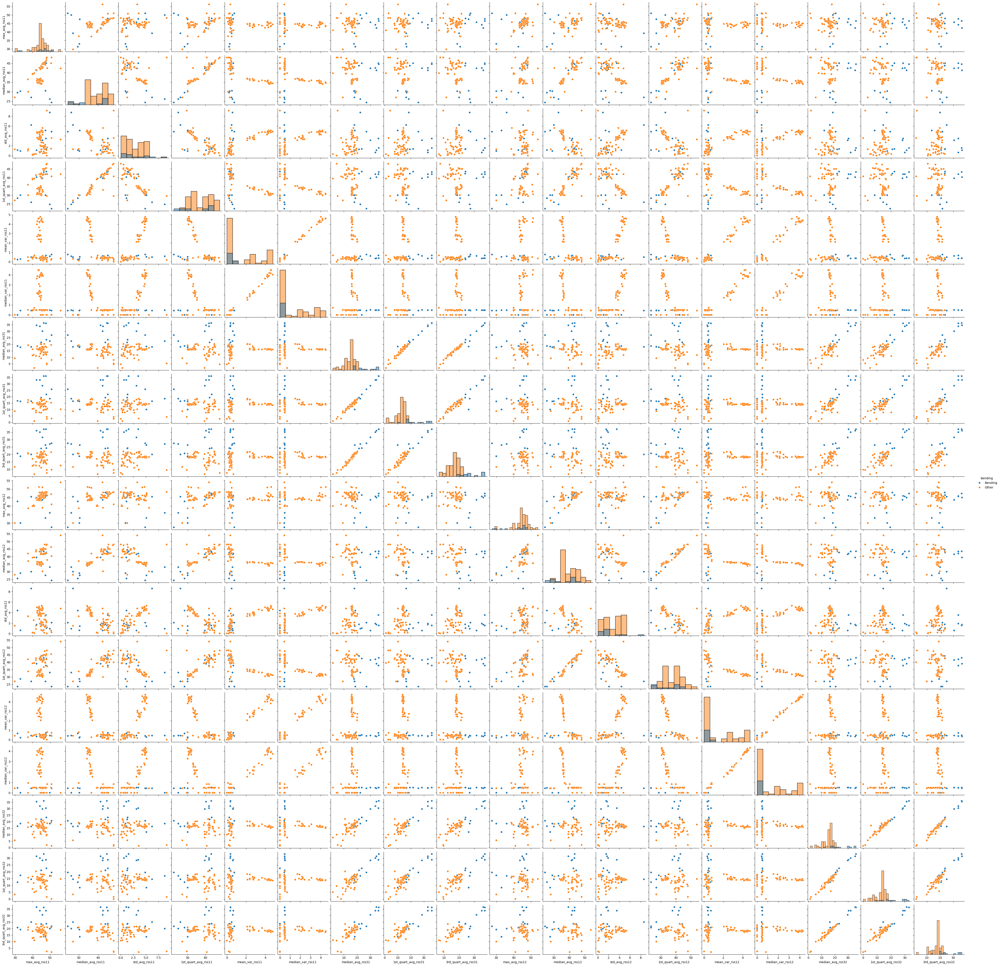

In [20]:
disp_cols = df_.iloc[:, [1, 3, 4, 5, 9, 10, 31, 33, 34, 1+42, 3+42, 4+42, 5+42, 9+42, 10+42, 31+42, 33+42, 34+42, -1]]
sns.pairplot(disp_cols, hue="bending", diag_kind="hist")

No, there is no discrenable difference in the results. 

In [21]:
X_train = {}
X_test = {}
for l in range(1, 21, 1):
    features = []
    
    for file in csv_files:
        data = pd.read_csv(file, header=None, na_values="?", skiprows=5)
        data.columns = ["time", "avg_rss12", "var_rss12", "avg_rss13", "var_rss13", "avg_rss23", "var_rss23"] 
        data = data.drop(columns = ["time"])
        d1 = data.iloc[:int(np.ceil(len(data)/l)), :]
        d1.columns = ["avg_rss11", "var_rss11", "avg_rss21", "var_rss21", "avg_rss31", "var_rss31"] 
        for i in range(1, l, 1):
            d2 = data.iloc[i*int(np.ceil(len(data)/l)):(i+1)*int(np.ceil(len(data)/l)), :].reset_index()
            d2 = d2.drop(columns = ["index"])
            d2.columns = ["avg_rss1"+str(i+1), "var_rss1"+str(i+1), "avg_rss2"+str(i+1), 
                          "var_rss2"+str(i+1), "avg_rss3"+str(i+1), "var_rss3"+str(i+1)] 
            d1 = d1.join(d2)
        
        features.append(d1)

    train = []
    test = []
    for i,f in enumerate(features):
        x = {}
        for col in f.columns:
            x[f'min_{col}'] = f[col].min()
            x[f'max_{col}'] = f[col].max()
            x[f'mean_{col}'] = f[col].mean()
            x[f'median_{col}'] = f[col].median()
            x[f'std_{col}'] = f[col].std()
            x[f'1st_quart_{col}'] = f[col].quantile(0.25)
            x[f'3rd_quart_{col}'] = f[col].quantile(0.75)
        if 'dataset1.csv' in csv_files[i] or 'dataset2.csv' in csv_files[i] or 'dataset3.csv' in csv_files[i]:
            if 'dataset3' in csv_files[i] and 'bending' in csv_files[i]:
                train.append(x)
            else:
                test.append(x)
        else:
            train.append(x)
            
    X_train[l] = pd.DataFrame(train)
    X_test[l] = pd.DataFrame(test)


In [22]:
Y_train = []
Y_test = []
for i,a in enumerate(csv_files):
    if 'dataset1.csv' in a or 'dataset2.csv' in a or 'dataset3.csv' in a:
        if 'dataset3' in a and 'bending' in a:
            Y_train.append(1)
        else:
            if 'bending' in a:
                Y_test.append(1)
            else:
                Y_test.append(0)
    else:
        if 'bending' in a:
            Y_train.append(1)
        else:
            Y_train.append(0)

Y_train = np.array(Y_train)
Y_test = np.array(Y_test)

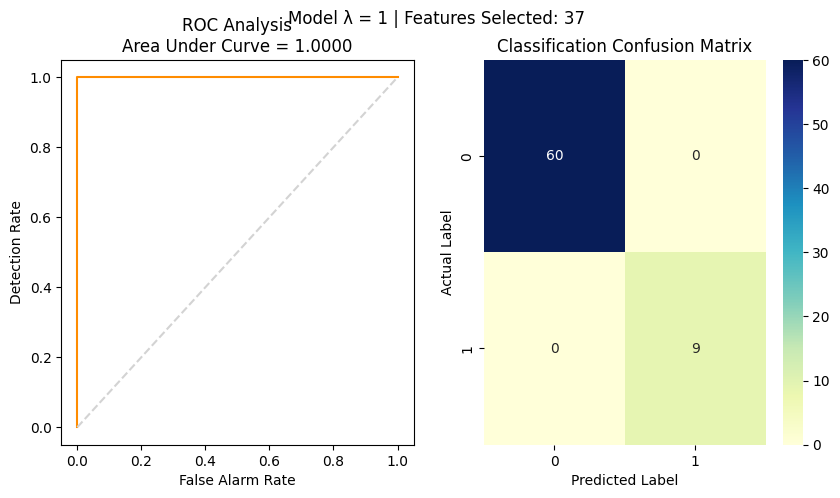

Model λ = 1 | Total Features Used = 37
Feature Set:
 Index(['min_avg_rss11', 'max_avg_rss11', 'mean_avg_rss11', 'median_avg_rss11',
       'std_avg_rss11', '1st_quart_avg_rss11', '3rd_quart_avg_rss11',
       'min_var_rss11', 'max_var_rss11', 'mean_var_rss11', 'median_var_rss11',
       'std_var_rss11', '1st_quart_var_rss11', '3rd_quart_var_rss11',
       'min_avg_rss21', 'max_avg_rss21', 'mean_avg_rss21', 'median_avg_rss21',
       'std_avg_rss21', '1st_quart_avg_rss21', '3rd_quart_avg_rss21',
       'min_var_rss21', 'mean_var_rss21', 'median_var_rss21', 'std_var_rss21',
       '1st_quart_var_rss21', '3rd_quart_var_rss21', 'min_avg_rss31',
       'max_avg_rss31', 'mean_avg_rss31', 'median_avg_rss31', 'std_avg_rss31',
       '3rd_quart_avg_rss31', 'min_var_rss31', 'mean_var_rss31',
       'median_var_rss31', '3rd_quart_var_rss31'],
      dtype='object')
                      Weights  P-Values
min_avg_rss11       -0.112281  0.864027
max_avg_rss11       -0.278865  0.077461
mean_avg_rss11

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


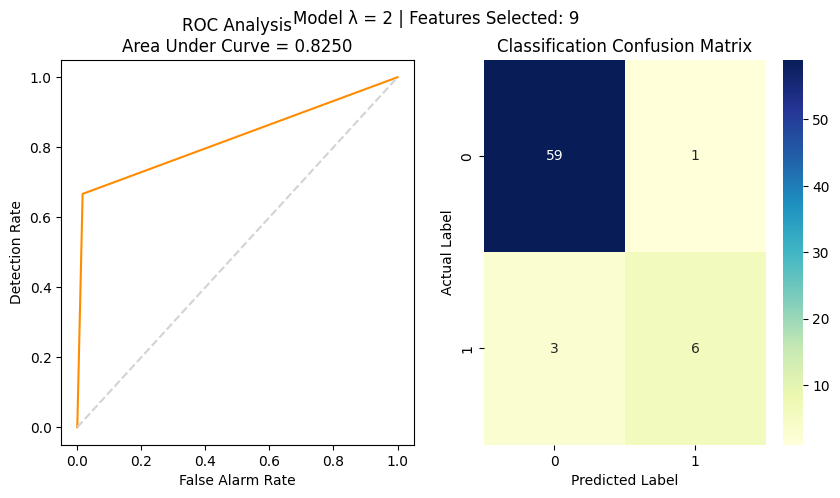

Model λ = 2 | Total Features Used = 9
Feature Set:
 Index(['max_avg_rss22', 'std_avg_rss11', 'median_var_rss31', 'std_avg_rss31',
       'max_avg_rss11', 'std_var_rss22', 'mean_var_rss31', 'median_var_rss12',
       'mean_var_rss12'],
      dtype='object')
                   Weights      P-Values
max_avg_rss22     0.393479  1.933786e-26
std_avg_rss11     0.902075  2.127103e-28
median_var_rss31  6.765491  1.720365e-28
std_avg_rss31     0.581009  1.248436e-29
max_avg_rss11    -0.201973  6.680565e-30
std_var_rss22    -4.189100  4.271181e-30
mean_var_rss31   -9.202513  3.584353e-30
median_var_rss12  0.072691  2.766358e-30
mean_var_rss12    0.504246  6.302396e-31
*********************************************
No Feature with P-Value >= 0.05 for l = 3
choosing feature with top 10% P-Values


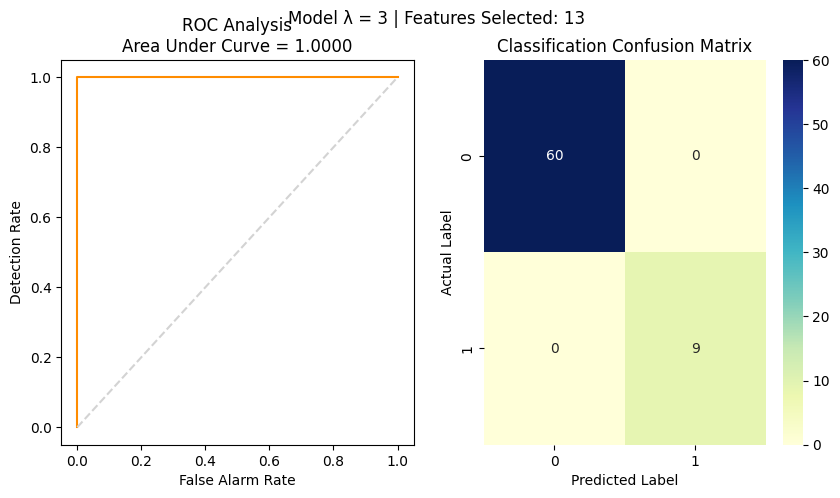

Model λ = 3 | Total Features Used = 13
Feature Set:
 Index(['1st_quart_var_rss21', 'std_avg_rss21', 'median_var_rss31',
       'mean_var_rss21', '3rd_quart_avg_rss12', '3rd_quart_avg_rss23',
       'mean_var_rss31', 'std_var_rss31', 'min_var_rss12', 'std_avg_rss31',
       '3rd_quart_avg_rss32', 'min_var_rss23', '3rd_quart_var_rss31'],
      dtype='object')
                       Weights      P-Values
1st_quart_var_rss21  -3.040258  2.510406e-29
std_avg_rss21        42.272485  2.023916e-29
median_var_rss31     -5.868682  1.074051e-29
mean_var_rss21        0.866444  2.472477e-30
3rd_quart_avg_rss12 -19.678624  2.137910e-30
3rd_quart_avg_rss23 -16.788659  1.368890e-30
mean_var_rss31       -5.739702  9.758851e-31
std_var_rss31         0.333573  1.048975e-31
min_var_rss12        -0.091028  3.891170e-32
std_avg_rss31        36.815162  1.380502e-32
3rd_quart_avg_rss32  37.374439  1.302146e-32
min_var_rss23        -0.091935  9.572074e-33
3rd_quart_var_rss31  -6.551778  9.205991e-33
**********

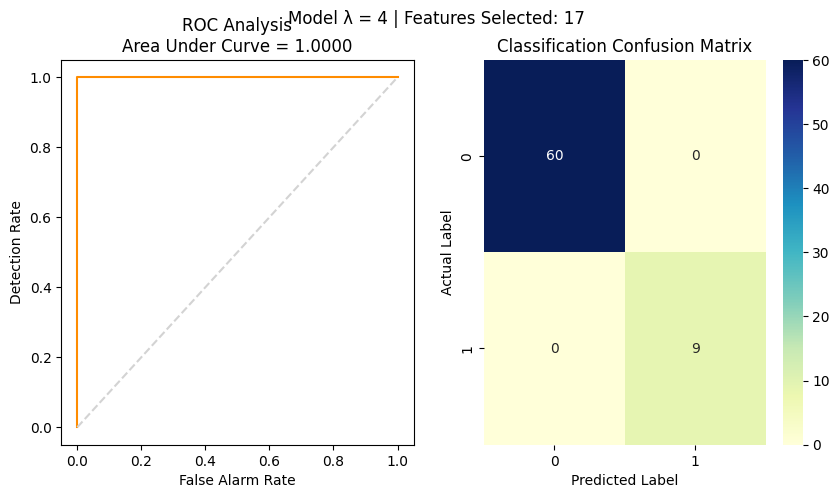

Model λ = 4 | Total Features Used = 17
Feature Set:
 Index(['1st_quart_var_rss31', 'std_var_rss23', 'max_var_rss22',
       'mean_var_rss32', 'median_avg_rss23', 'max_var_rss12', 'mean_avg_rss21',
       'median_var_rss32', '3rd_quart_var_rss31', 'std_var_rss31',
       '3rd_quart_avg_rss11', '1st_quart_avg_rss14', 'std_avg_rss23',
       'median_var_rss33', 'min_var_rss14', 'max_var_rss14',
       '1st_quart_var_rss32'],
      dtype='object')
                        Weights      P-Values
1st_quart_var_rss31 -182.098575  1.817001e-29
std_var_rss23         81.966115  4.820302e-31
max_var_rss22         10.490426  3.302023e-32
mean_var_rss32      -101.761590  3.143950e-32
median_avg_rss23       5.238739  2.663305e-33
max_var_rss12        -21.944650  2.167592e-33
mean_avg_rss21         6.726439  7.420610e-34
median_var_rss32      53.488859  5.692466e-34
3rd_quart_var_rss31 -130.401607  5.495657e-34
std_var_rss31        395.227225  4.517308e-34
3rd_quart_avg_rss11   -8.963790  2.947668e-34


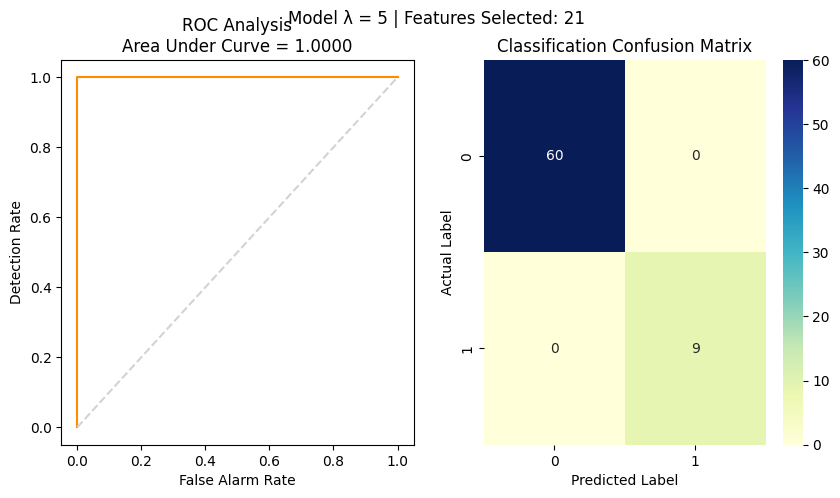

Model λ = 5 | Total Features Used = 21
Feature Set:
 Index(['3rd_quart_var_rss23', '1st_quart_avg_rss31', 'mean_var_rss21',
       'std_avg_rss33', 'mean_avg_rss21', 'max_var_rss31', 'mean_var_rss31',
       'mean_avg_rss31', 'median_avg_rss15', '3rd_quart_avg_rss24',
       'std_avg_rss14', 'std_var_rss21', 'std_var_rss31', 'median_var_rss33',
       'max_var_rss35', 'max_avg_rss13', '3rd_quart_avg_rss33',
       'median_avg_rss22', 'max_avg_rss21', 'std_avg_rss21',
       '1st_quart_var_rss12'],
      dtype='object')
                      Weights      P-Values
3rd_quart_var_rss23 -0.272004  3.371952e-27
1st_quart_avg_rss31  1.745228  2.662764e-27
mean_var_rss21      -0.147027  8.313918e-28
std_avg_rss33        0.008601  4.159605e-28
mean_avg_rss21      -1.040225  3.336344e-28
max_var_rss31        0.178603  1.116998e-28
mean_var_rss31      -0.211566  8.309302e-29
mean_avg_rss31       2.308771  6.208800e-29
median_avg_rss15    -0.544518  2.371935e-29
3rd_quart_avg_rss24  1.005044  1.45

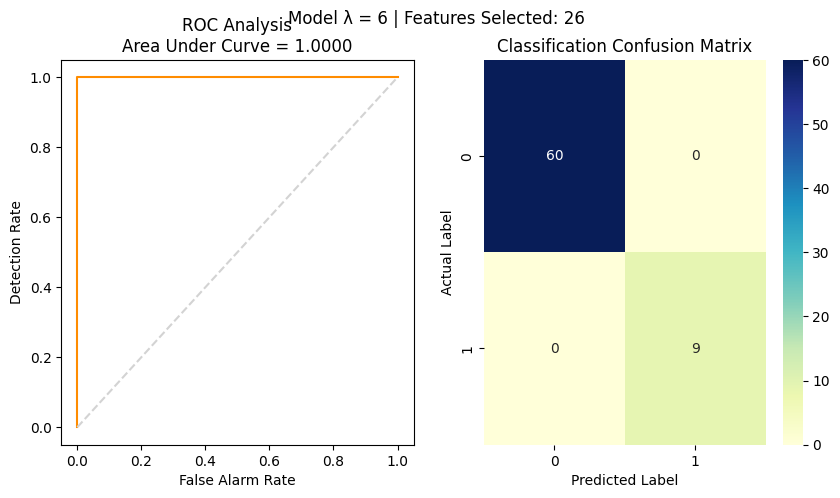

Model λ = 6 | Total Features Used = 26
Feature Set:
 Index(['median_var_rss21', '3rd_quart_var_rss26', 'max_avg_rss35',
       'max_avg_rss21', 'min_var_rss31', 'mean_var_rss21', 'median_var_rss31',
       'std_var_rss36', 'max_var_rss25', 'mean_var_rss31', 'std_var_rss21',
       'mean_avg_rss21', 'max_var_rss13', 'std_var_rss31', 'mean_var_rss24',
       '1st_quart_var_rss32', 'min_avg_rss21', 'mean_var_rss13',
       'std_avg_rss25', '3rd_quart_var_rss36', 'max_avg_rss24',
       'min_avg_rss22', 'median_var_rss36', '1st_quart_var_rss24',
       'min_var_rss16', 'std_avg_rss32'],
      dtype='object')
                        Weights      P-Values
median_var_rss21     -79.027300  6.041725e-27
3rd_quart_var_rss26  -19.828275  3.095835e-29
max_avg_rss35         47.713294  8.549350e-30
max_avg_rss21         22.761951  6.076838e-30
min_var_rss31         -2.212872  4.118775e-30
mean_var_rss21        23.221082  3.205759e-30
median_var_rss31    -201.691528  1.321379e-30
std_var_rss36       

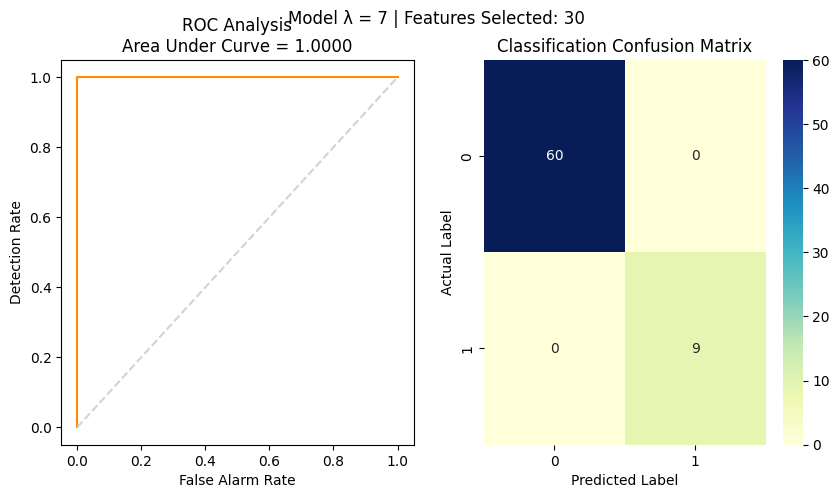

Model λ = 7 | Total Features Used = 30
Feature Set:
 Index(['mean_var_rss31', 'std_var_rss31', 'mean_var_rss21', 'std_avg_rss21',
       'mean_avg_rss21', 'mean_avg_rss31', 'std_var_rss21', 'min_var_rss26',
       'median_avg_rss12', 'mean_avg_rss14', 'std_avg_rss23',
       'median_var_rss36', '3rd_quart_var_rss34', '3rd_quart_var_rss27',
       'min_avg_rss17', 'max_avg_rss13', 'mean_var_rss27',
       '1st_quart_var_rss21', 'std_avg_rss11', '3rd_quart_avg_rss33',
       '3rd_quart_avg_rss32', 'max_avg_rss21', 'median_var_rss17',
       'std_avg_rss26', 'std_avg_rss31', 'median_var_rss31',
       '3rd_quart_avg_rss21', 'mean_avg_rss33', 'min_var_rss27',
       'median_var_rss27'],
      dtype='object')
                      Weights      P-Values
mean_var_rss31      -0.563039  1.410558e-25
std_var_rss31       -0.196213  1.281124e-25
mean_var_rss21      -0.303695  7.311639e-26
std_avg_rss21        1.142088  9.872543e-30
mean_avg_rss21      -1.801986  8.977734e-30
mean_avg_rss31       4

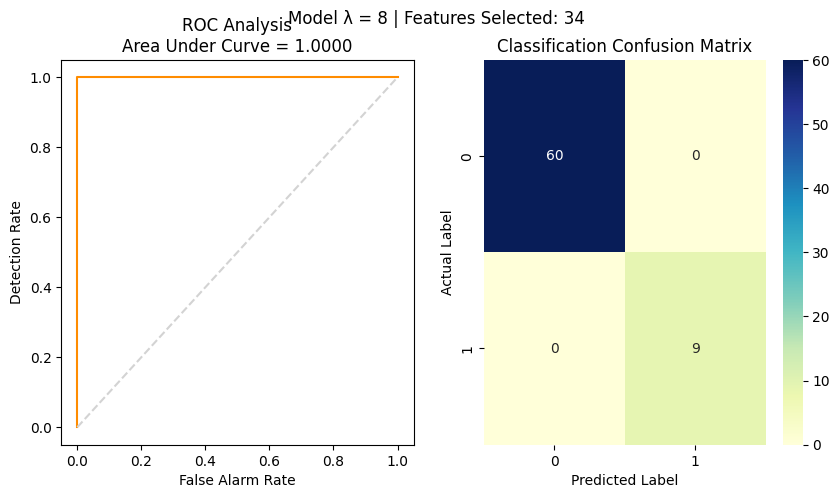

Model λ = 8 | Total Features Used = 34
Feature Set:
 Index(['std_var_rss34', 'min_var_rss25', 'mean_var_rss21', 'std_var_rss31',
       'median_var_rss25', 'mean_var_rss31', 'mean_avg_rss21', 'std_avg_rss21',
       'std_var_rss21', 'std_avg_rss34', 'std_avg_rss31', 'min_avg_rss16',
       'std_var_rss24', 'mean_avg_rss31', 'max_avg_rss23', 'min_var_rss36',
       'std_avg_rss26', 'max_avg_rss34', 'median_avg_rss22', 'max_avg_rss21',
       '3rd_quart_avg_rss21', 'min_avg_rss17', '1st_quart_avg_rss22',
       'min_var_rss17', '3rd_quart_avg_rss18', 'median_var_rss28',
       'min_avg_rss31', 'median_avg_rss18', '1st_quart_var_rss38',
       '1st_quart_var_rss21', 'min_avg_rss38', 'max_var_rss11',
       'std_avg_rss18', '1st_quart_avg_rss13'],
      dtype='object')
                       Weights      P-Values
std_var_rss34        -1.150498  1.243742e-25
min_var_rss25        -0.155896  1.549148e-26
mean_var_rss21       -1.507646  7.806986e-28
std_var_rss31        -0.534973  3.537777e-28

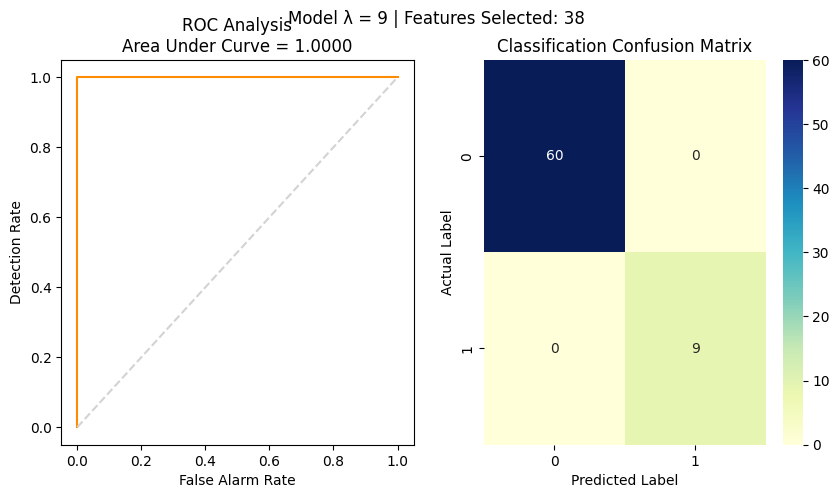

Model λ = 9 | Total Features Used = 38
Feature Set:
 Index(['3rd_quart_avg_rss19', 'median_var_rss21', 'mean_var_rss21',
       'std_var_rss31', 'median_var_rss31', 'mean_var_rss31', 'std_avg_rss24',
       'std_avg_rss21', 'std_var_rss33', 'std_var_rss21', 'std_var_rss22',
       'median_avg_rss25', 'mean_avg_rss31', '1st_quart_var_rss23',
       'median_var_rss18', 'mean_avg_rss21', 'max_avg_rss31',
       'median_avg_rss33', 'std_avg_rss31', 'std_var_rss32',
       '3rd_quart_avg_rss11', '3rd_quart_avg_rss21', 'max_avg_rss21',
       'mean_avg_rss15', '3rd_quart_var_rss14', 'median_var_rss14',
       'median_var_rss28', 'std_var_rss38', 'median_var_rss23',
       'mean_var_rss22', 'median_var_rss26', '3rd_quart_avg_rss38',
       'max_var_rss33', 'min_var_rss19', '1st_quart_var_rss21',
       'std_avg_rss11', '3rd_quart_var_rss15', 'max_avg_rss12'],
      dtype='object')
                      Weights      P-Values
3rd_quart_avg_rss19 -1.347906  2.287642e-23
median_var_rss21    -0.15

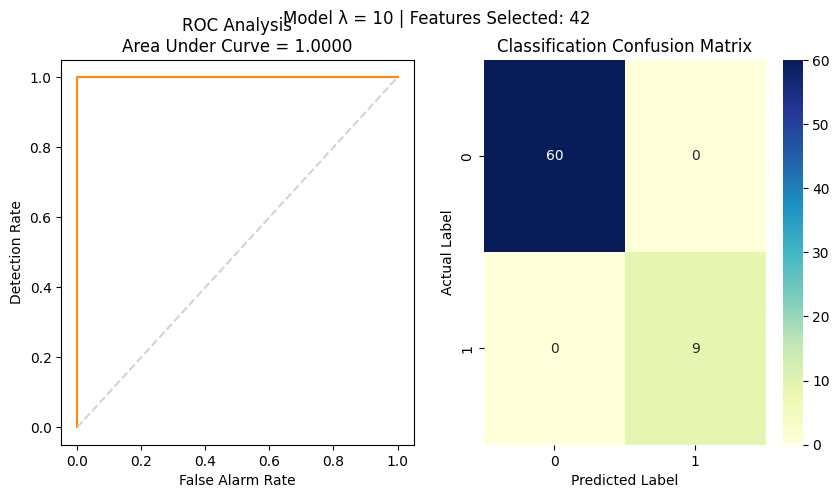

Model λ = 10 | Total Features Used = 42
Feature Set:
 Index(['median_var_rss21', 'min_var_rss35', '3rd_quart_var_rss23',
       'std_var_rss31', 'mean_var_rss31', 'min_var_rss28',
       '3rd_quart_avg_rss21', 'mean_avg_rss11', 'std_avg_rss21',
       'median_var_rss210', 'min_var_rss31', 'mean_var_rss12', 'min_var_rss27',
       'max_var_rss19', 'min_avg_rss21', 'mean_var_rss21',
       '1st_quart_var_rss21', 'mean_avg_rss22', 'max_avg_rss37',
       '3rd_quart_avg_rss33', 'min_avg_rss13', 'std_avg_rss29',
       'min_var_rss23', '3rd_quart_var_rss34', 'mean_avg_rss21',
       'min_avg_rss310', 'median_avg_rss210', 'max_avg_rss35',
       '1st_quart_var_rss110', 'min_var_rss15', 'min_avg_rss24',
       'mean_var_rss34', 'median_var_rss27', 'std_var_rss33', 'std_var_rss18',
       'median_var_rss26', 'std_var_rss35', '3rd_quart_var_rss19',
       'std_var_rss39', 'max_var_rss25', 'std_avg_rss18', 'min_var_rss25'],
      dtype='object')
                        Weights      P-Values
medi

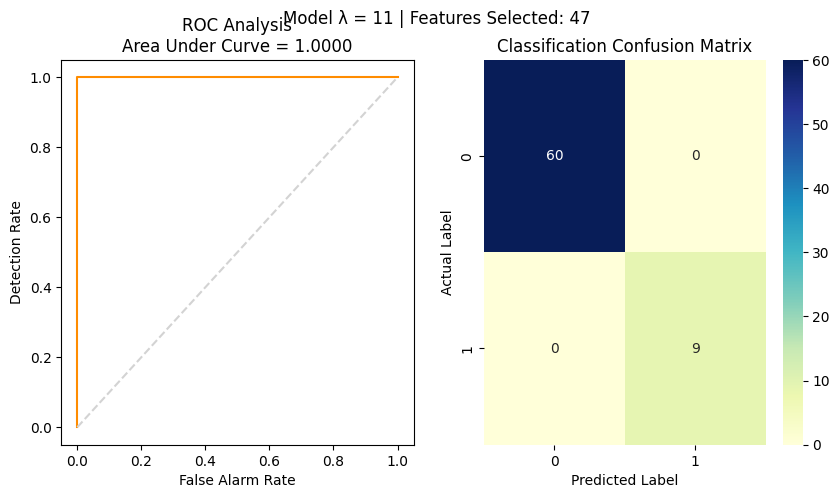

Model λ = 11 | Total Features Used = 47
Feature Set:
 Index(['min_avg_rss11', 'median_var_rss21', 'std_avg_rss39', 'max_var_rss36',
       '1st_quart_var_rss12', 'min_avg_rss14', '1st_quart_var_rss31',
       'std_var_rss21', 'median_avg_rss31', 'max_avg_rss35', 'std_avg_rss21',
       'median_var_rss33', '3rd_quart_var_rss310', 'median_avg_rss26',
       '1st_quart_var_rss18', 'min_avg_rss31', 'std_avg_rss22',
       'mean_var_rss11', '3rd_quart_avg_rss37', '1st_quart_avg_rss26',
       'mean_var_rss21', 'min_avg_rss39', '3rd_quart_var_rss23',
       'std_avg_rss31', 'median_var_rss36', 'max_avg_rss32', 'max_avg_rss26',
       'mean_var_rss111', '3rd_quart_var_rss35', 'std_var_rss31',
       'median_var_rss23', 'mean_var_rss31', 'median_var_rss27',
       'min_avg_rss32', 'median_avg_rss27', 'mean_var_rss23',
       'median_var_rss311', '1st_quart_var_rss19', 'median_var_rss38',
       'median_avg_rss34', '3rd_quart_avg_rss11', 'max_avg_rss36',
       'mean_avg_rss310', 'median_avg_rs

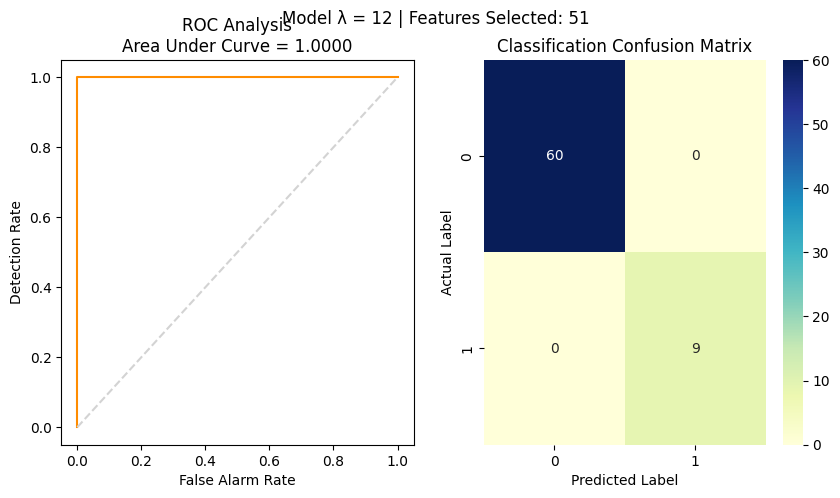

Model λ = 12 | Total Features Used = 51
Feature Set:
 Index(['1st_quart_var_rss31', 'mean_avg_rss112', 'median_avg_rss311',
       'min_avg_rss211', 'median_var_rss23', 'max_var_rss21',
       '3rd_quart_var_rss31', 'median_var_rss311', 'min_var_rss28',
       '1st_quart_avg_rss110', '1st_quart_avg_rss16', 'min_var_rss110',
       '1st_quart_avg_rss12', '3rd_quart_var_rss37', '3rd_quart_avg_rss11',
       'mean_var_rss111', 'mean_var_rss31', '3rd_quart_avg_rss26',
       'median_avg_rss14', 'mean_avg_rss37', 'mean_var_rss15', 'min_var_rss23',
       'min_var_rss29', 'median_var_rss15', 'std_avg_rss16',
       'median_avg_rss28', 'mean_avg_rss21', '1st_quart_var_rss310',
       '1st_quart_avg_rss14', 'mean_var_rss21', '3rd_quart_var_rss36',
       'median_var_rss24', 'min_var_rss36', 'std_avg_rss31',
       '1st_quart_var_rss36', 'max_avg_rss31', 'min_avg_rss32',
       'max_avg_rss210', 'std_var_rss31', 'mean_avg_rss35', 'min_var_rss35',
       'median_avg_rss110', 'min_avg_rss310', '3

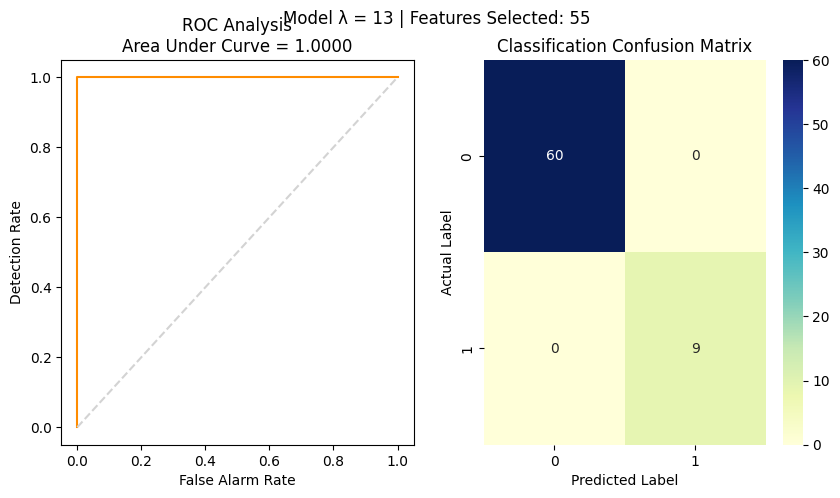

Model λ = 13 | Total Features Used = 55
Feature Set:
 Index(['3rd_quart_var_rss21', 'mean_var_rss21', 'min_var_rss23',
       'min_var_rss16', 'std_var_rss21', 'std_var_rss17', 'std_avg_rss21',
       'mean_var_rss31', 'mean_avg_rss36', 'std_var_rss31',
       '3rd_quart_var_rss29', '3rd_quart_avg_rss27', 'mean_avg_rss38',
       'mean_var_rss29', 'min_var_rss211', '1st_quart_var_rss26',
       'std_var_rss23', 'min_avg_rss313', 'std_var_rss26', 'min_avg_rss23',
       'std_var_rss19', 'mean_var_rss22', 'max_var_rss18',
       '1st_quart_var_rss32', '1st_quart_var_rss21', 'min_avg_rss24',
       '1st_quart_avg_rss12', '3rd_quart_avg_rss38', 'min_var_rss310',
       'min_avg_rss38', '3rd_quart_var_rss38', '3rd_quart_var_rss22',
       'min_var_rss39', 'median_var_rss13', 'mean_var_rss211', 'max_var_rss27',
       '3rd_quart_avg_rss211', 'median_var_rss29', 'max_avg_rss111',
       'median_avg_rss211', 'median_var_rss212', 'min_var_rss33',
       '3rd_quart_var_rss35', 'min_var_rss29', '

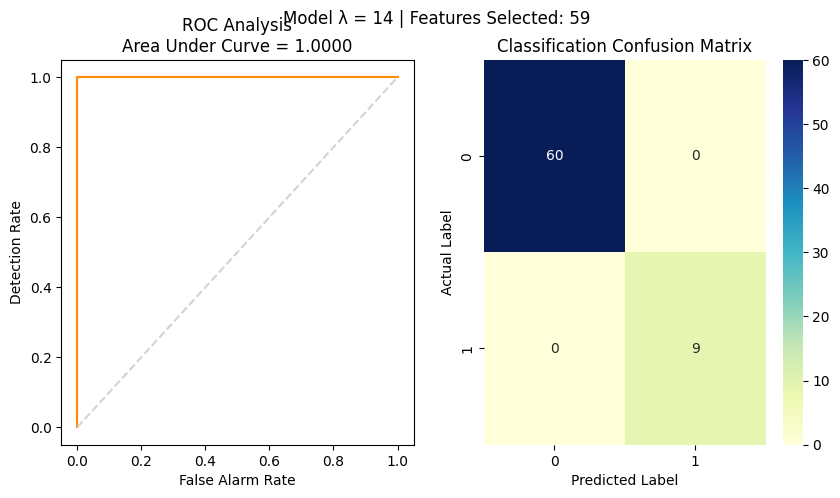

Model λ = 14 | Total Features Used = 59
Feature Set:
 Index(['median_var_rss21', 'std_avg_rss34', '3rd_quart_var_rss21',
       'median_var_rss212', 'max_avg_rss111', 'std_var_rss21',
       'median_var_rss31', 'mean_var_rss21', '3rd_quart_var_rss31',
       'std_var_rss29', 'std_var_rss31', 'max_var_rss18', 'median_var_rss13',
       'min_var_rss11', 'median_var_rss311', 'mean_var_rss31',
       'std_var_rss113', '3rd_quart_var_rss24', 'min_var_rss17',
       '1st_quart_avg_rss310', '3rd_quart_avg_rss12', 'min_var_rss211',
       'std_avg_rss21', '1st_quart_avg_rss17', 'min_var_rss33',
       'std_var_rss39', 'max_avg_rss18', 'min_var_rss37', 'median_avg_rss22',
       'std_var_rss213', 'median_var_rss26', '3rd_quart_var_rss313',
       'max_avg_rss19', 'mean_var_rss110', 'median_avg_rss35', 'std_avg_rss11',
       'min_avg_rss27', 'std_var_rss35', 'median_var_rss24', 'min_var_rss311',
       'max_var_rss39', 'std_var_rss110', 'mean_var_rss312', 'mean_var_rss313',
       'std_avg_rss1

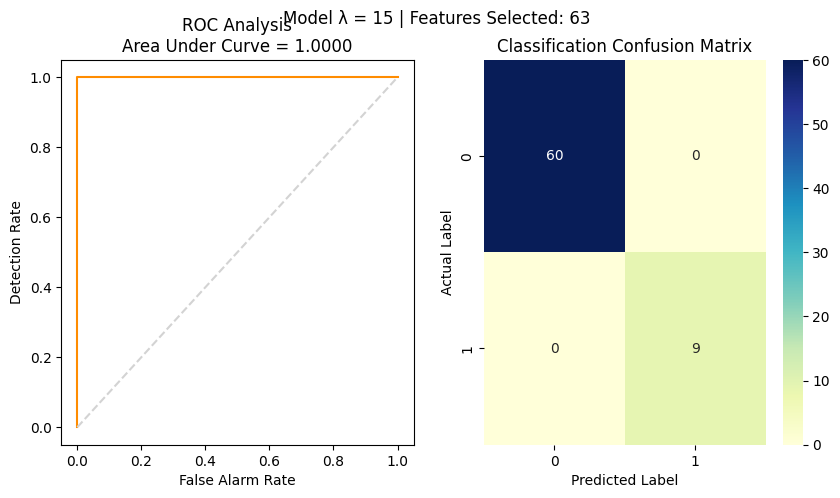

Model λ = 15 | Total Features Used = 63
Feature Set:
 Index(['std_var_rss21', '1st_quart_avg_rss110', 'mean_var_rss21',
       'median_var_rss21', '3rd_quart_var_rss21', 'min_var_rss34',
       '1st_quart_var_rss36', 'mean_var_rss26', 'std_var_rss31',
       'max_var_rss19', 'median_var_rss31', '3rd_quart_var_rss28',
       'mean_var_rss31', 'median_var_rss313', 'mean_var_rss32',
       '3rd_quart_var_rss111', 'median_var_rss34', 'median_var_rss212',
       '3rd_quart_var_rss27', 'mean_var_rss34', '3rd_quart_var_rss19',
       'min_var_rss214', 'mean_var_rss311', 'max_avg_rss31',
       'median_avg_rss115', 'median_avg_rss28', 'mean_var_rss210',
       'std_avg_rss113', '3rd_quart_var_rss212', '3rd_quart_var_rss310',
       'mean_avg_rss22', 'mean_var_rss36', 'median_var_rss214',
       '3rd_quart_avg_rss17', 'median_avg_rss36', 'min_var_rss37',
       'max_var_rss26', 'median_var_rss28', 'std_avg_rss21',
       'median_var_rss23', 'min_avg_rss24', 'min_avg_rss112',
       'mean_var_rs

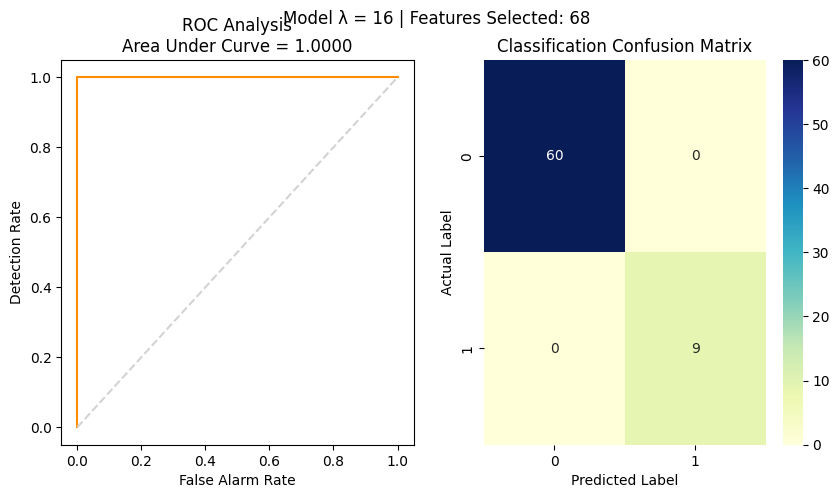

Model λ = 16 | Total Features Used = 68
Feature Set:
 Index(['median_var_rss21', 'std_var_rss31', '3rd_quart_var_rss21',
       'min_var_rss26', 'mean_var_rss21', 'median_var_rss215',
       '3rd_quart_avg_rss18', 'std_var_rss21', 'median_var_rss31',
       'std_var_rss37', 'median_var_rss26', 'mean_var_rss31',
       '1st_quart_avg_rss13', '1st_quart_var_rss29', '3rd_quart_var_rss215',
       'median_avg_rss115', 'max_var_rss31', 'mean_var_rss35', 'std_avg_rss11',
       'std_avg_rss31', 'mean_var_rss27', 'max_var_rss27', 'max_avg_rss18',
       'mean_var_rss18', 'mean_var_rss316', 'mean_avg_rss22', 'min_avg_rss35',
       'median_avg_rss39', 'min_var_rss210', '3rd_quart_var_rss213',
       '1st_quart_var_rss315', '3rd_quart_var_rss12', 'mean_avg_rss21',
       'mean_var_rss29', 'min_var_rss112', '3rd_quart_var_rss27',
       'mean_var_rss24', 'max_var_rss36', 'min_var_rss311', 'min_var_rss21',
       'max_var_rss112', 'median_var_rss33', 'median_var_rss35',
       'min_var_rss212', '

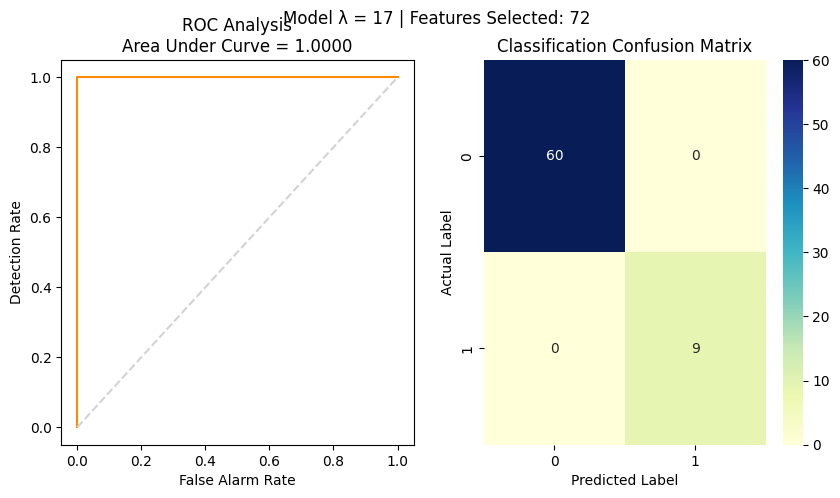

Model λ = 17 | Total Features Used = 72
Feature Set:
 Index(['median_var_rss21', '3rd_quart_var_rss21', 'min_avg_rss31',
       'min_var_rss27', 'min_avg_rss12', 'median_var_rss31', 'max_var_rss19',
       'mean_var_rss21', 'median_var_rss29', 'std_var_rss21', 'mean_var_rss31',
       'max_var_rss214', 'std_var_rss115', 'std_var_rss31',
       '1st_quart_var_rss33', 'min_var_rss213', 'median_avg_rss14',
       '1st_quart_avg_rss314', '3rd_quart_var_rss39', 'median_var_rss23',
       '3rd_quart_var_rss28', 'min_avg_rss212', '3rd_quart_var_rss27',
       '1st_quart_var_rss23', 'mean_avg_rss21', 'std_avg_rss115',
       'std_avg_rss112', 'min_avg_rss210', '3rd_quart_var_rss25',
       'min_var_rss117', 'std_avg_rss21', 'std_var_rss112',
       'median_var_rss316', 'mean_var_rss29', 'std_avg_rss17', 'std_var_rss18',
       '3rd_quart_var_rss17', 'max_avg_rss29', 'median_var_rss215',
       'median_avg_rss13', '3rd_quart_var_rss213', 'min_avg_rss111',
       'mean_var_rss117', 'min_var_rss1

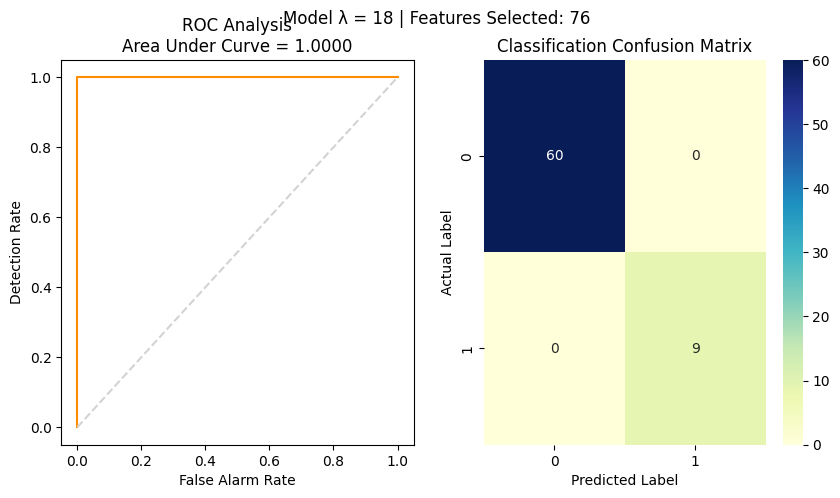

Model λ = 18 | Total Features Used = 76
Feature Set:
 Index(['std_avg_rss31', '3rd_quart_var_rss21', 'std_var_rss31',
       'mean_var_rss21', 'std_var_rss21', 'mean_var_rss313',
       '1st_quart_var_rss21', 'mean_var_rss31', 'median_var_rss37',
       'max_var_rss36', 'mean_var_rss34', 'median_avg_rss28', 'mean_avg_rss31',
       'max_var_rss315', 'std_avg_rss21', 'min_avg_rss29', 'mean_avg_rss216',
       'min_avg_rss28', 'mean_avg_rss21', 'min_avg_rss114', 'min_var_rss214',
       '3rd_quart_var_rss15', 'mean_avg_rss215', 'median_avg_rss11',
       'min_avg_rss313', 'max_var_rss110', 'mean_var_rss13',
       'median_var_rss318', 'max_var_rss17', 'median_avg_rss317',
       'median_var_rss117', '1st_quart_var_rss38', '1st_quart_var_rss24',
       'max_avg_rss114', 'min_avg_rss26', 'max_var_rss21',
       '1st_quart_avg_rss211', 'std_var_rss32', '3rd_quart_avg_rss31',
       'max_avg_rss34', 'median_var_rss27', 'min_avg_rss213',
       '3rd_quart_avg_rss11', 'min_var_rss215', 'std_av

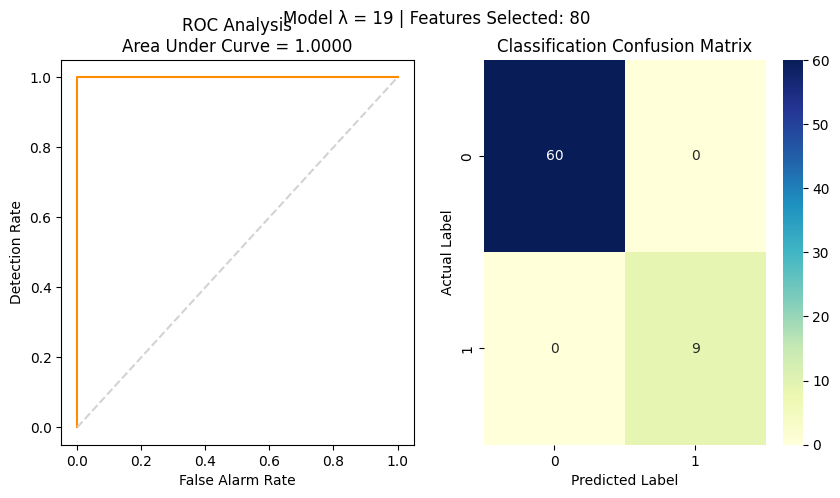

Model λ = 19 | Total Features Used = 80
Feature Set:
 Index(['std_var_rss21', 'mean_var_rss21', 'min_var_rss28',
       '3rd_quart_var_rss21', 'min_var_rss37', 'std_var_rss29',
       '1st_quart_var_rss119', 'std_var_rss31', 'median_var_rss31',
       'mean_var_rss31', 'min_var_rss110', 'std_var_rss16',
       'median_avg_rss119', 'std_var_rss14', '3rd_quart_var_rss113',
       '1st_quart_avg_rss35', 'median_avg_rss115', 'mean_avg_rss21',
       'min_var_rss29', '3rd_quart_var_rss317', 'std_avg_rss21',
       'std_avg_rss31', '3rd_quart_var_rss16', 'std_var_rss11',
       'median_avg_rss216', 'min_var_rss311', '1st_quart_var_rss219',
       'median_avg_rss21', '3rd_quart_var_rss118', 'std_var_rss112',
       'std_avg_rss111', 'mean_var_rss15', 'mean_avg_rss31', 'max_var_rss112',
       'std_var_rss18', 'std_avg_rss315', '3rd_quart_var_rss212',
       'max_var_rss210', 'median_var_rss17', 'median_avg_rss24',
       'mean_var_rss16', 'mean_var_rss210', 'std_avg_rss32', 'max_avg_rss15',
 

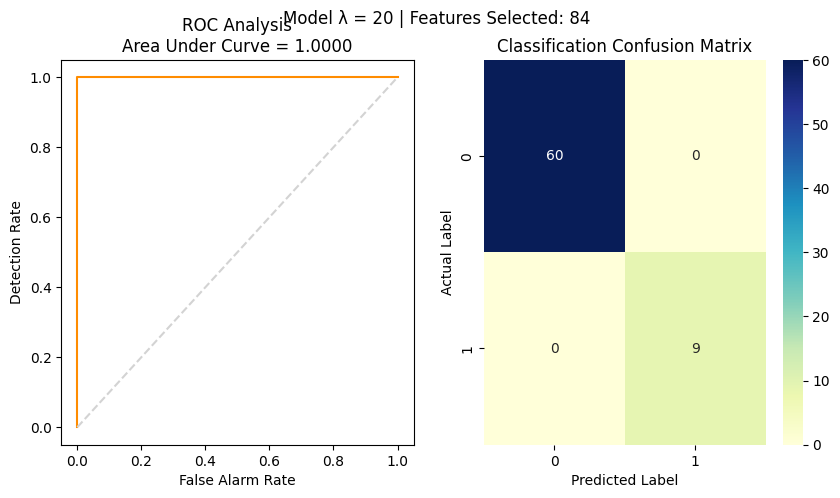

Model λ = 20 | Total Features Used = 84
Feature Set:
 Index(['mean_var_rss21', 'std_var_rss21', '3rd_quart_var_rss21',
       'median_var_rss31', 'std_avg_rss31', 'std_var_rss215', 'std_var_rss31',
       'mean_var_rss31', '1st_quart_var_rss25', 'std_avg_rss21',
       'std_avg_rss114', '3rd_quart_avg_rss218', 'mean_avg_rss31',
       'mean_avg_rss21', 'mean_var_rss23', '3rd_quart_avg_rss311',
       'std_var_rss34', 'min_var_rss14', 'max_var_rss17', 'median_var_rss114',
       'std_var_rss313', 'median_avg_rss110', 'mean_var_rss33',
       'std_var_rss32', '3rd_quart_avg_rss35', 'mean_var_rss17',
       '3rd_quart_var_rss17', 'std_avg_rss14', 'mean_var_rss110',
       'min_var_rss23', 'min_var_rss11', 'mean_var_rss118', 'mean_avg_rss314',
       'max_avg_rss117', '1st_quart_avg_rss12', '3rd_quart_var_rss36',
       'max_var_rss215', 'median_var_rss29', 'min_var_rss33', 'min_var_rss320',
       'max_var_rss110', 'mean_var_rss29', 'max_var_rss312', 'min_var_rss119',
       'mean_var_rss

In [23]:
X_reduced_train = {}
X_reduced_test = {}
model = LogisticRegression(penalty=None, max_iter=100)

for l in range(1, 21, 1): 
    model_statsmodels = sm.OLS(Y_train, X_train[l])
    results = model_statsmodels.fit()    
    p = results.pvalues
    indicies = [i for i in range(len(p)) if p.iloc[i] >= 0.05]
    if indicies == []:
        print("*********************************************")
        print(f'No Feature with P-Value >= 0.05 for l = {l}')
        print("choosing feature with top 10% P-Values")
        indicies = np.argsort(-p)[:int(np.ceil(len(p)/10))]

    p = p.iloc[indicies]
    X_reduced_train[l] = X_train[l].iloc[:, indicies]
    X_reduced_test[l] = X_test[l].iloc[:, indicies]

    model.fit(X_reduced_train[l], Y_train)
    Y_pred = model.predict(X_reduced_train[l])

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f'Model λ = {l} | Features Selected: {len(indicies)}')
    FPR, TPR, thresholds = roc_curve(Y_train, Y_pred) 
    ax1.plot(FPR, TPR, color="darkorange")
    ax1.plot([0, 1], [0, 1], linestyle='--', color="lightgray")
    ax1.set(xlabel="False Alarm Rate", ylabel="Detection Rate")
    ax1.set_title(f'ROC Analysis\nArea Under Curve = {roc_auc_score(Y_train, Y_pred):.4f}')
    sns.heatmap(confusion_matrix(Y_train, Y_pred), annot=True, cmap="YlGnBu", ax=ax2)
    ax2.set(xlabel="Predicted Label", ylabel="Actual Label")
    ax2.set_title("Classification Confusion Matrix")
    plt.show()

    print(f'Model λ = {l} | Total Features Used = {len(indicies)}\nFeature Set:\n', X_reduced_train[l].columns)
    print(pd.DataFrame({"Weights": model.coef_[0], "P-Values": p}))


In [24]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_reduced_train[l], Y_train, cv=5))
    model.fit(X_reduced_train[l], Y_train)
    Y_pred = model.predict(X_reduced_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')


l = 1
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 2
Cross Validation Scores: [0.85714286 1.         0.35714286 0.64285714 0.92307692]
Test Accuracy: 0.7895
l = 3
Cross Validation Scores: [0.85714286 1.         0.64285714 0.92857143 1.        ]
Test Accuracy: 0.9474
l = 4
Cross Validation Scores: [0.92857143 0.85714286 0.35714286 0.78571429 0.92307692]
Test Accuracy: 0.9474
l = 5
Cross Validation Scores: [0.85714286 1.         0.85714286 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 6
Cross Validation Scores: [0.92857143 0.85714286 0.71428571 0.71428571 0.92307692]
Test Accuracy: 0.8947
l = 7
Cross Validation Scores: [0.85714286 1.         0.85714286 0.85714286 1.        ]
Test Accuracy: 1.0000
l = 8
Cross Validation Scores: [0.85714286 1.         0.85714286 0.71428571 1.        ]
Test Accuracy: 0.9474
l = 9
Cross Validation Scores: [0.92857143 1.         0.92857143 1.         1.        ]
Test Accuracy: 0.9474
l = 10
Cro

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

Cross Validation Scores: [0.92857143 1.         0.85714286 1.         0.92307692]
Test Accuracy: 1.0000
l = 18
Cross Validation Scores: [0.92857143 1.         0.92857143 1.         1.        ]
Test Accuracy: 1.0000
l = 19
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 20
Cross Validation Scores: [0.92857143 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000


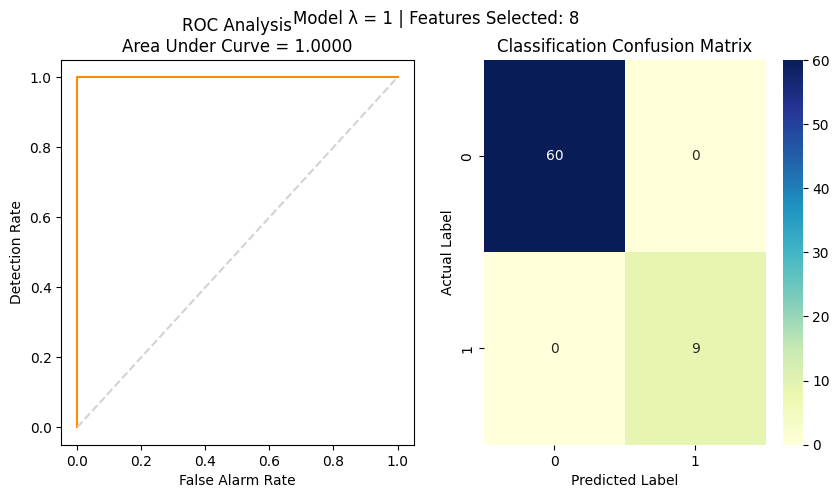

l = 1, Number of Relevant Features = 8, Features:
 Index(['mean_avg_rss11', '1st_quart_avg_rss11', '3rd_quart_avg_rss11',
       'max_var_rss11', 'median_avg_rss21', 'min_avg_rss31', 'max_avg_rss31',
       '1st_quart_avg_rss31'],
      dtype='object')
   Model Params
0     -0.092242
1     -0.072416
2     -0.396294
3     -0.378720
4     -0.000126
5      0.440002
6      0.584705
7      0.207087


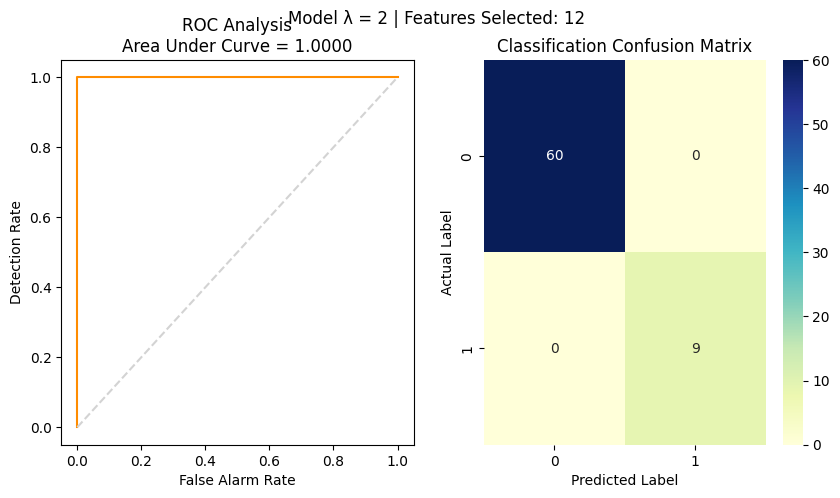

l = 2, Number of Relevant Features = 12, Features:
 Index(['median_avg_rss11', '1st_quart_avg_rss11', 'max_var_rss11',
       '1st_quart_avg_rss21', 'min_avg_rss31', 'max_avg_rss31',
       'max_avg_rss12', 'median_avg_rss12', '3rd_quart_avg_rss12',
       'max_var_rss12', 'min_avg_rss32', '1st_quart_avg_rss32'],
      dtype='object')
    Model Params
0      -0.222933
1      -0.030992
2      -0.335526
3      -0.049650
4       0.491232
5       0.508411
6      -0.049030
7      -0.145142
8      -0.037880
9      -0.123007
10      0.022569
11      0.148772


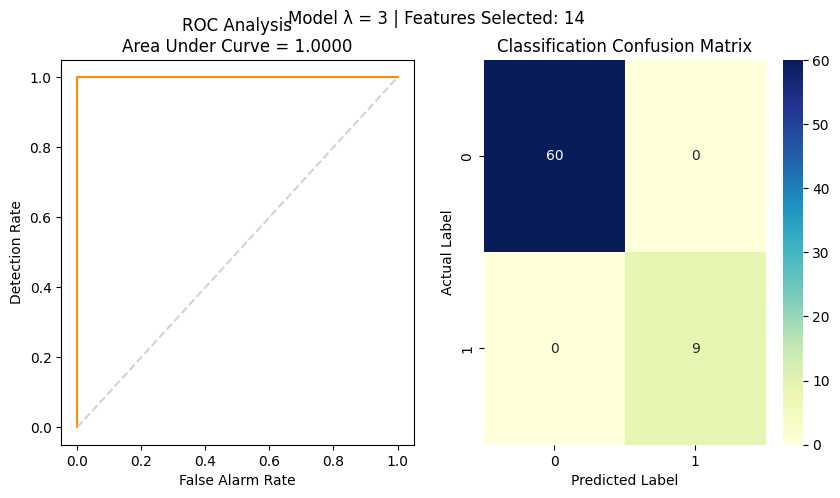

l = 3, Number of Relevant Features = 14, Features:
 Index(['median_avg_rss11', '3rd_quart_avg_rss11', 'max_var_rss11',
       '1st_quart_avg_rss21', 'min_avg_rss31', 'max_avg_rss31',
       '3rd_quart_avg_rss31', 'max_avg_rss12', '3rd_quart_avg_rss12',
       'min_avg_rss32', 'max_avg_rss13', 'max_var_rss13', 'min_avg_rss33',
       'max_var_rss33'],
      dtype='object')
    Model Params
0      -0.055493
1      -0.058518
2      -0.386517
3      -0.063197
4       0.169031
5       0.506654
6       0.120655
7      -0.068358
8      -0.210203
9       0.067924
10     -0.046019
11     -0.004837
12      0.082375
13     -0.004162


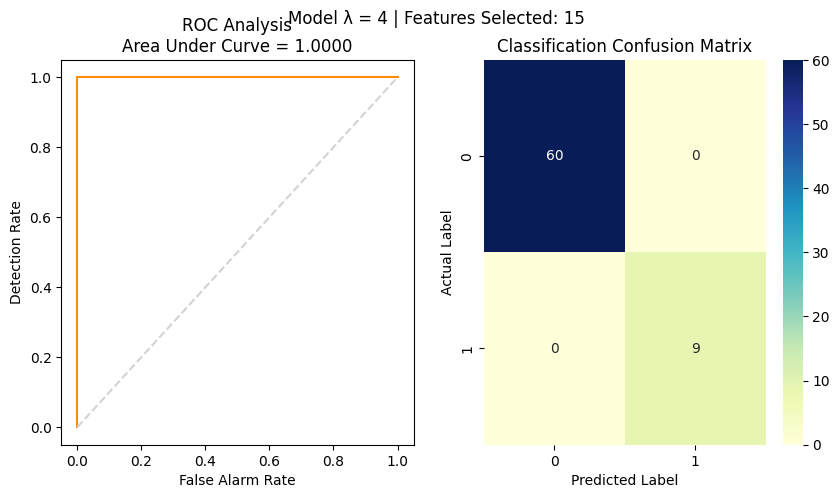

l = 4, Number of Relevant Features = 15, Features:
 Index(['max_avg_rss11', 'median_avg_rss11', '3rd_quart_avg_rss11',
       'max_var_rss11', '1st_quart_avg_rss21', 'max_avg_rss31',
       'mean_avg_rss31', '1st_quart_avg_rss31', '3rd_quart_avg_rss31',
       'max_avg_rss12', 'median_avg_rss13', '1st_quart_avg_rss13',
       '3rd_quart_avg_rss13', 'min_avg_rss33', 'max_var_rss33'],
      dtype='object')
    Model Params
0      -0.037547
1      -0.000025
2      -0.049510
3      -0.230450
4      -0.120799
5       0.407849
6       0.002116
7       0.019554
8       0.278096
9      -0.012256
10     -0.092667
11     -0.076776
12     -0.177568
13      0.164174
14     -0.152791


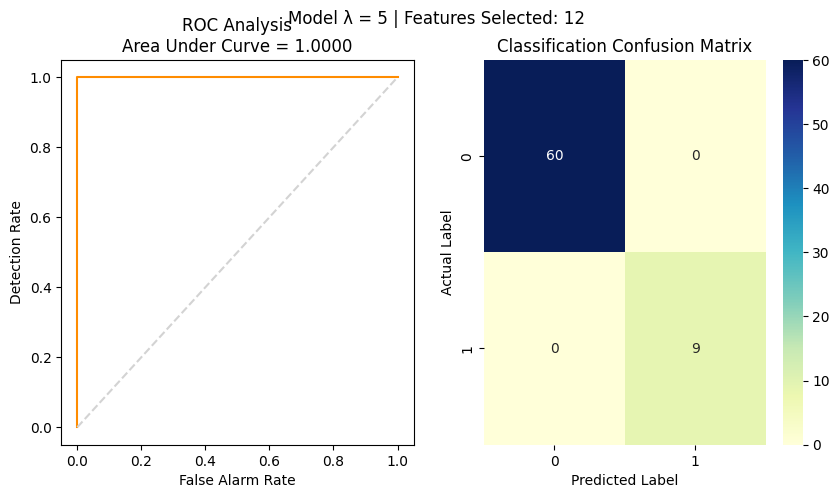

l = 5, Number of Relevant Features = 12, Features:
 Index(['min_avg_rss21', 'min_avg_rss31', 'max_avg_rss31',
       '3rd_quart_avg_rss31', 'max_var_rss12', 'min_avg_rss32',
       'max_avg_rss13', '3rd_quart_avg_rss13', '3rd_quart_avg_rss14',
       'max_var_rss14', 'min_avg_rss34', '1st_quart_avg_rss35'],
      dtype='object')
    Model Params
0      -0.128963
1       0.061237
2       0.219308
3       0.441278
4      -0.214604
5       0.046265
6      -0.066973
7      -0.263074
8      -0.144514
9      -0.005226
10      0.062526
11      0.110577


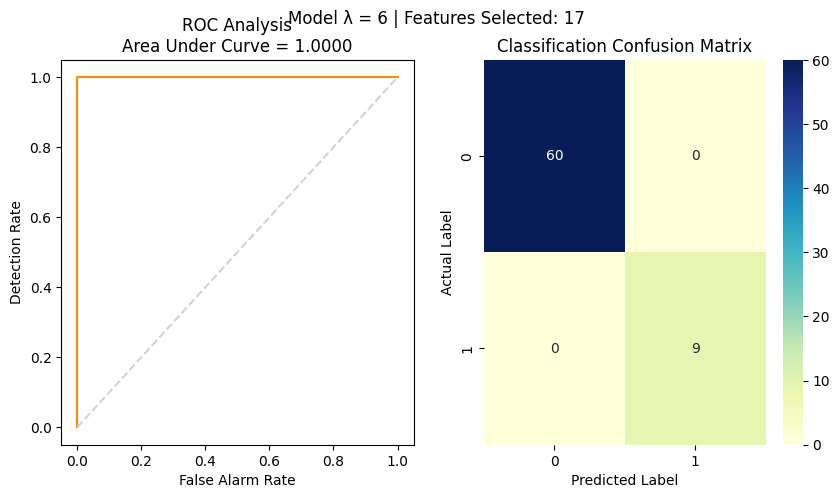

l = 6, Number of Relevant Features = 17, Features:
 Index(['max_avg_rss11', '3rd_quart_avg_rss11', 'min_avg_rss21',
       'min_avg_rss31', 'max_avg_rss31', 'mean_avg_rss31',
       '3rd_quart_avg_rss31', 'max_var_rss12', 'min_avg_rss32',
       'max_avg_rss32', 'max_avg_rss13', 'median_avg_rss14',
       '3rd_quart_avg_rss14', 'min_avg_rss34', '3rd_quart_avg_rss15',
       'max_var_rss16', '1st_quart_avg_rss36'],
      dtype='object')
    Model Params
0      -0.063053
1      -0.011618
2      -0.085218
3       0.031375
4       0.148797
5       0.083948
6       0.214546
7      -0.227523
8       0.114252
9       0.144308
10     -0.043169
11     -0.129975
12     -0.083999
13      0.126424
14     -0.122394
15     -0.058009
16      0.086170


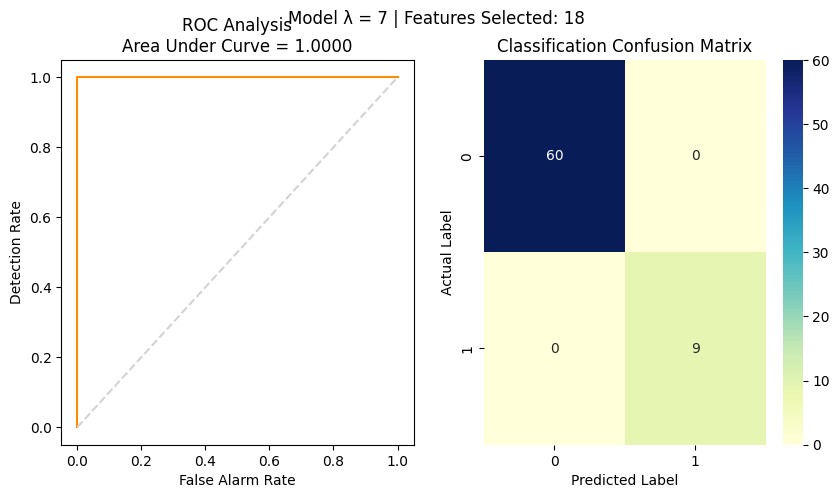

l = 7, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss11', '3rd_quart_avg_rss11', 'min_avg_rss21',
       'max_avg_rss31', '3rd_quart_avg_rss31', 'max_var_rss12',
       'min_avg_rss32', 'max_avg_rss32', 'max_avg_rss14',
       '3rd_quart_avg_rss14', 'max_var_rss14', 'max_avg_rss15',
       '3rd_quart_avg_rss15', 'min_avg_rss35', 'min_avg_rss36',
       'min_avg_rss27', 'max_avg_rss27', '1st_quart_avg_rss37'],
      dtype='object')
    Model Params
0      -0.048469
1      -0.001502
2      -0.078074
3       0.175435
4       0.278324
5      -0.124252
6       0.199516
7       0.097949
8      -0.157993
9      -0.083321
10     -0.011676
11     -0.089568
12     -0.080007
13      0.072532
14      0.122143
15     -0.000280
16     -0.000084
17      0.049912


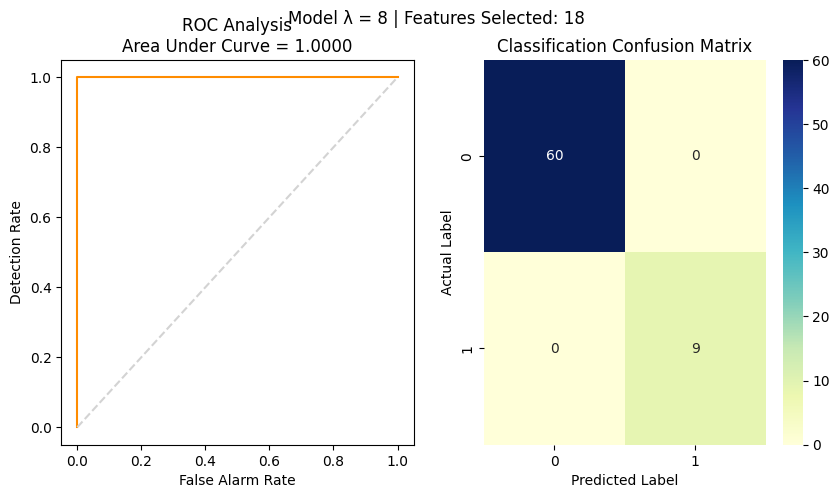

l = 8, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss11', '3rd_quart_avg_rss11', 'max_avg_rss31',
       '3rd_quart_avg_rss31', 'max_var_rss12', 'min_avg_rss22',
       'max_avg_rss32', 'mean_avg_rss32', '3rd_quart_avg_rss32',
       'min_avg_rss33', 'max_avg_rss15', 'median_avg_rss15',
       '3rd_quart_avg_rss15', 'max_avg_rss16', '3rd_quart_avg_rss16',
       'max_var_rss16', 'min_avg_rss37', 'min_avg_rss28'],
      dtype='object')
    Model Params
0      -0.036338
1      -0.000289
2       0.160111
3       0.064633
4      -0.044666
5      -0.001162
6       0.119949
7       0.015705
8       0.218986
9       0.138516
10     -0.008289
11     -0.105992
12     -0.127465
13     -0.108816
14     -0.088250
15     -0.203195
16      0.256375
17     -0.002677


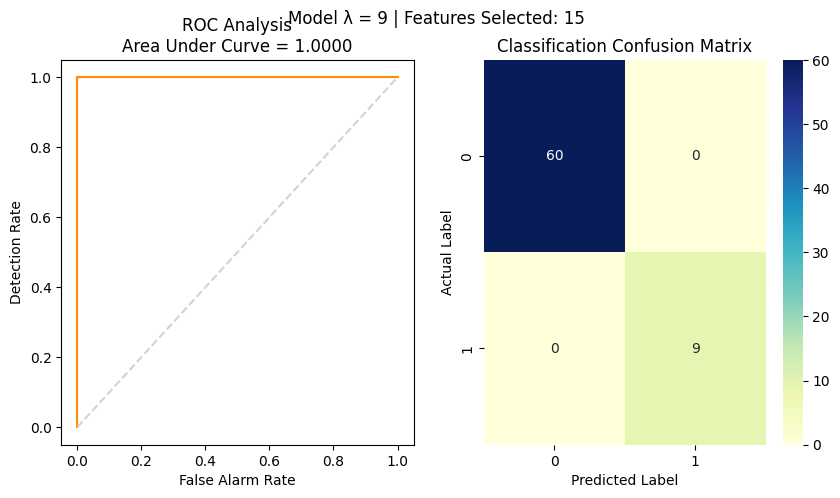

l = 9, Number of Relevant Features = 15, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'max_avg_rss32', 'median_avg_rss32',
       '1st_quart_avg_rss32', '3rd_quart_avg_rss32', 'min_avg_rss33',
       'max_avg_rss15', '3rd_quart_avg_rss15', 'max_var_rss15',
       'max_avg_rss16', '3rd_quart_avg_rss16', 'max_avg_rss17',
       '3rd_quart_avg_rss17', 'min_avg_rss38'],
      dtype='object')
    Model Params
0      -0.034894
1       0.164288
2       0.003847
3       0.323774
4       0.034858
5       0.113492
6       0.105312
7      -0.234190
8      -0.020234
9      -0.083767
10     -0.025780
11     -0.014289
12     -0.083295
13     -0.060767
14      0.250541


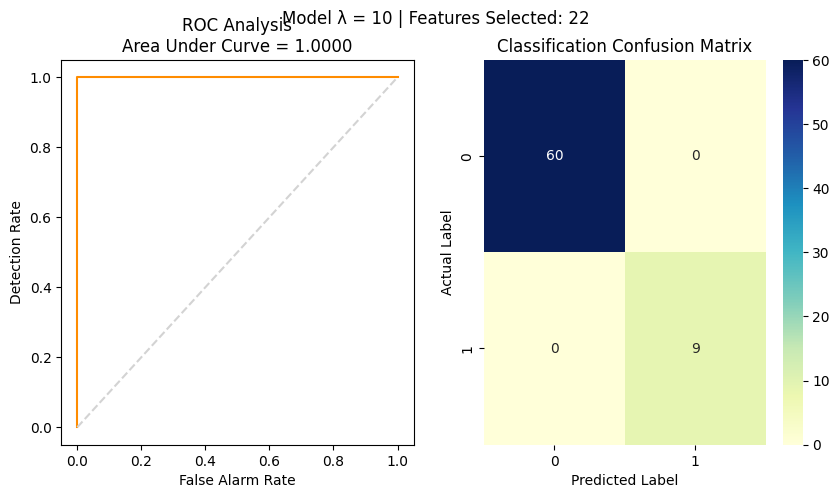

l = 10, Number of Relevant Features = 22, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'max_avg_rss12',
       '3rd_quart_avg_rss12', 'mean_avg_rss32', 'median_avg_rss32',
       '1st_quart_avg_rss32', '3rd_quart_avg_rss32', 'max_var_rss13',
       'min_avg_rss14', 'max_var_rss14', '1st_quart_avg_rss24',
       'max_avg_rss15', 'max_avg_rss16', 'median_avg_rss16',
       '3rd_quart_avg_rss16', 'max_avg_rss17', '3rd_quart_avg_rss17',
       'max_avg_rss18', '3rd_quart_avg_rss18', 'min_avg_rss29',
       'min_avg_rss39'],
      dtype='object')
    Model Params
0      -0.024135
1       0.080040
2      -0.000083
3      -0.013816
4       0.093524
5       0.137385
6       0.278773
7       0.078162
8      -0.005684
9       0.007196
10     -0.071539
11     -0.022136
12     -0.081776
13     -0.056670
14     -0.042859
15     -0.076085
16     -0.012057
17     -0.031993
18     -0.068677
19     -0.052869
20     -0.002349
21      0.324579


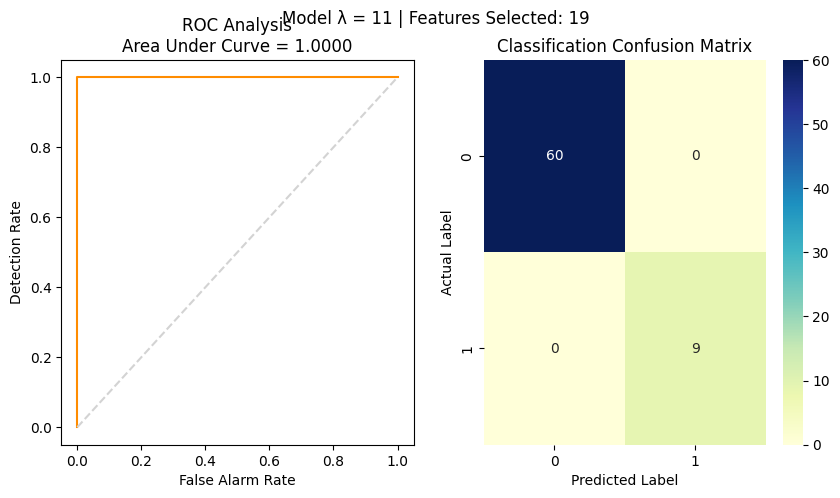

l = 11, Number of Relevant Features = 19, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32',
       'median_avg_rss32', '1st_quart_avg_rss32', 'max_var_rss13',
       'min_avg_rss34', 'max_avg_rss16', 'max_avg_rss17', 'median_avg_rss17',
       '3rd_quart_avg_rss17', 'max_avg_rss18', '3rd_quart_avg_rss18',
       '3rd_quart_avg_rss19', 'min_avg_rss110', 'max_avg_rss210',
       '3rd_quart_avg_rss210', 'min_avg_rss310'],
      dtype='object')
    Model Params
0       0.039291
1      -0.056821
2       0.112241
3       0.098855
4       0.129987
5       0.280789
6      -0.014233
7       0.017247
8      -0.174387
9      -0.001125
10     -0.025552
11     -0.063556
12     -0.065034
13     -0.024977
14     -0.027723
15      0.027998
16     -0.024489
17     -0.000556
18      0.270008


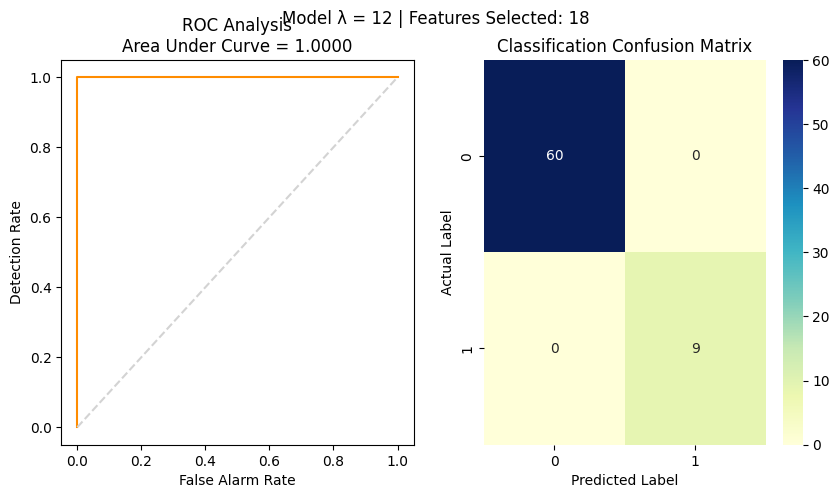

l = 12, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32', 'median_avg_rss32',
       '1st_quart_avg_rss32', 'max_avg_rss13', 'min_avg_rss34',
       'min_avg_rss25', 'max_avg_rss16', 'max_avg_rss17',
       '3rd_quart_avg_rss17', 'max_avg_rss18', '3rd_quart_avg_rss18',
       'max_avg_rss19', '3rd_quart_avg_rss19', 'max_avg_rss211',
       '3rd_quart_avg_rss211', 'min_avg_rss311'],
      dtype='object')
    Model Params
0      -0.030824
1       0.175598
2       0.026748
3       0.095885
4       0.314260
5      -0.002233
6       0.095609
7      -0.001175
8      -0.078707
9      -0.113127
10     -0.033180
11     -0.059172
12     -0.014987
13     -0.050700
14     -0.008337
15     -0.033762
16     -0.000794
17      0.245897


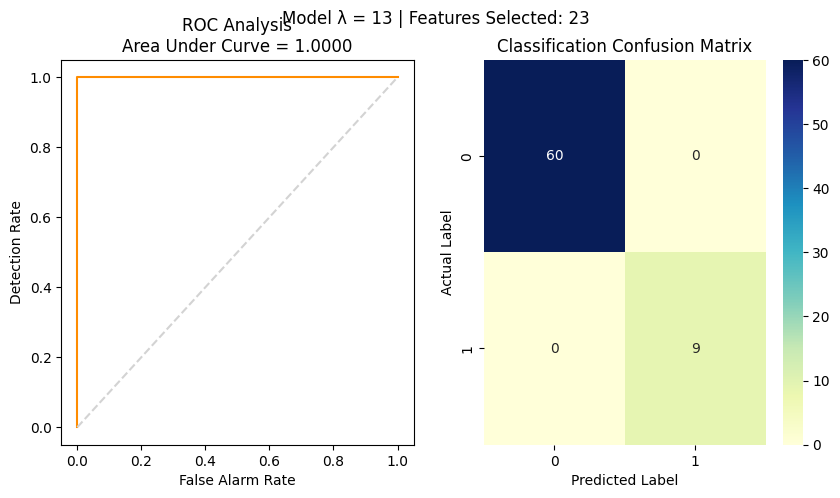

l = 13, Number of Relevant Features = 23, Features:
 Index(['max_avg_rss11', 'max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32',
       'median_avg_rss32', '1st_quart_avg_rss32', '3rd_quart_avg_rss32',
       'max_avg_rss13', 'max_avg_rss14', 'min_avg_rss34', 'max_avg_rss16',
       'max_avg_rss26', 'max_avg_rss17', 'max_avg_rss18', 'median_avg_rss18',
       '3rd_quart_avg_rss18', 'max_avg_rss19', '3rd_quart_avg_rss19',
       'max_avg_rss110', '3rd_quart_avg_rss110', 'max_avg_rss111',
       'min_avg_rss312', 'max_avg_rss113'],
      dtype='object')
    Model Params
0      -0.015799
1      -0.042781
2       0.300634
3       0.074375
4       0.104968
5       0.126870
6       0.019553
7      -0.004558
8      -0.003292
9       0.147670
10     -0.016984
11     -0.014582
12     -0.051870
13     -0.031116
14     -0.010151
15     -0.051665
16     -0.072678
17     -0.009293
18     -0.064603
19     -0.020022
20     -0.013707
21      0.243146
22     -0.010940


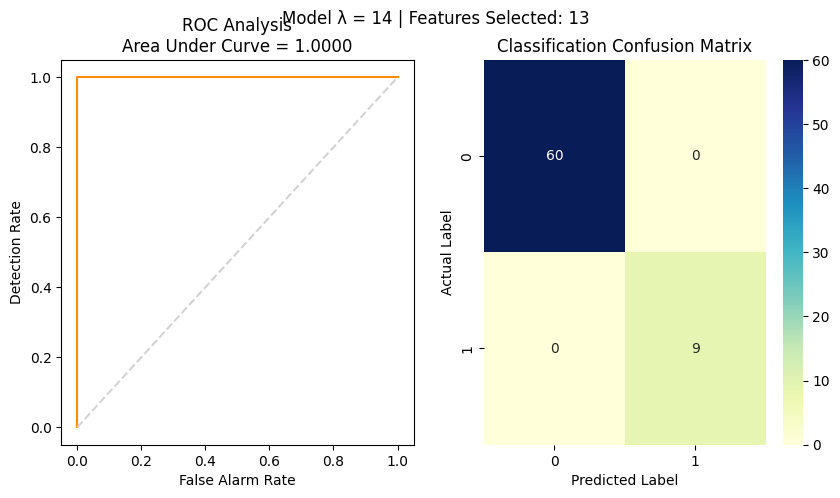

l = 14, Number of Relevant Features = 13, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32', 'median_avg_rss32',
       '3rd_quart_avg_rss32', 'min_avg_rss34', 'max_avg_rss17',
       'max_avg_rss18', 'max_avg_rss19', 'max_avg_rss110', 'max_avg_rss111',
       'min_avg_rss312', 'min_avg_rss313'],
      dtype='object')
    Model Params
0      -0.026841
1       0.368916
2       0.002124
3       0.150324
4       0.020642
5       0.248451
6      -0.087466
7      -0.178345
8      -0.030154
9      -0.060020
10     -0.015327
11      0.161198
12      0.040873


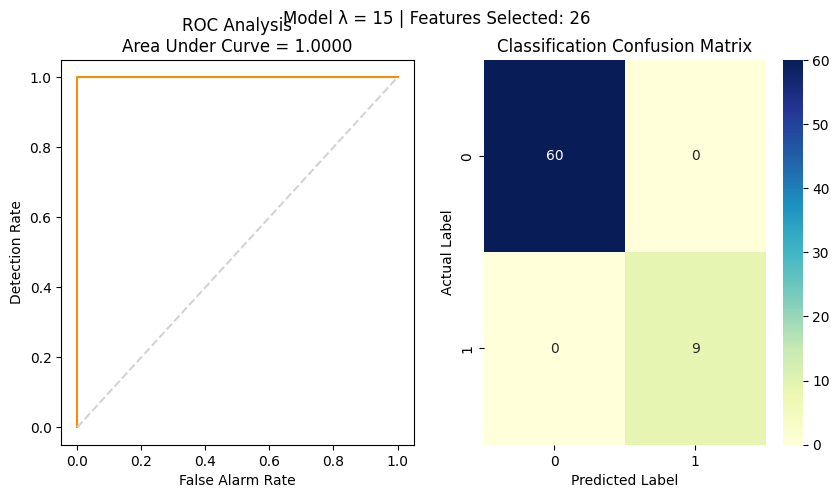

l = 15, Number of Relevant Features = 26, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32',
       'median_avg_rss32', '3rd_quart_avg_rss32', 'mean_avg_rss33',
       'median_avg_rss33', '1st_quart_avg_rss33', '3rd_quart_avg_rss33',
       'min_avg_rss35', 'max_avg_rss17', 'max_avg_rss18', 'max_avg_rss19',
       'mean_avg_rss19', 'median_avg_rss19', '3rd_quart_avg_rss19',
       'max_avg_rss110', '3rd_quart_avg_rss110', 'max_avg_rss111',
       '3rd_quart_avg_rss111', 'max_avg_rss112', '3rd_quart_avg_rss112',
       'min_avg_rss313', 'max_avg_rss214', 'min_avg_rss314'],
      dtype='object')
    Model Params
0       0.022742
1      -0.012813
2       0.160042
3       0.018039
4       0.103848
5       0.041972
6       0.036746
7       0.115415
8       0.140740
9       0.052102
10      0.157517
11     -0.025444
12     -0.057432
13     -0.050029
14     -0.013748
15     -0.024550
16     -0.063929
17     -0.035391
18     -0.018236
19     -0.062567
20    

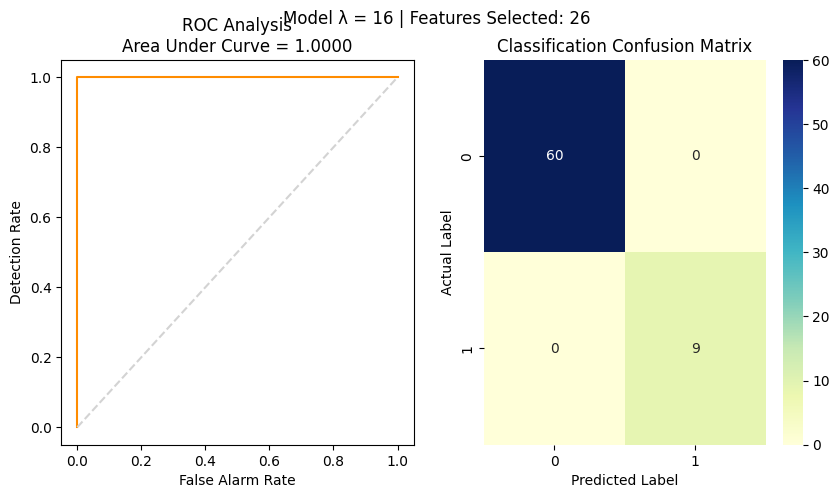

l = 16, Number of Relevant Features = 26, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32',
       '3rd_quart_avg_rss32', 'max_avg_rss13', 'min_avg_rss33',
       'mean_avg_rss33', 'median_avg_rss33', '1st_quart_avg_rss33',
       '3rd_quart_avg_rss33', 'min_avg_rss35', 'max_avg_rss18',
       'max_avg_rss19', '3rd_quart_avg_rss19', 'max_avg_rss110',
       'median_avg_rss110', '3rd_quart_avg_rss110', 'max_avg_rss111',
       '3rd_quart_avg_rss111', 'max_avg_rss112', '3rd_quart_avg_rss112',
       'max_avg_rss113', '3rd_quart_avg_rss113', 'max_avg_rss215',
       'min_avg_rss315'],
      dtype='object')
    Model Params
0       0.022404
1      -0.015774
2       0.158665
3       0.008987
4       0.030444
5      -0.004836
6       0.096735
7       0.075428
8       0.092937
9       0.122789
10      0.052760
11      0.129131
12     -0.054543
13     -0.064140
14     -0.023449
15     -0.017848
16     -0.023410
17     -0.021634
18     -0.048560
19     -0.01

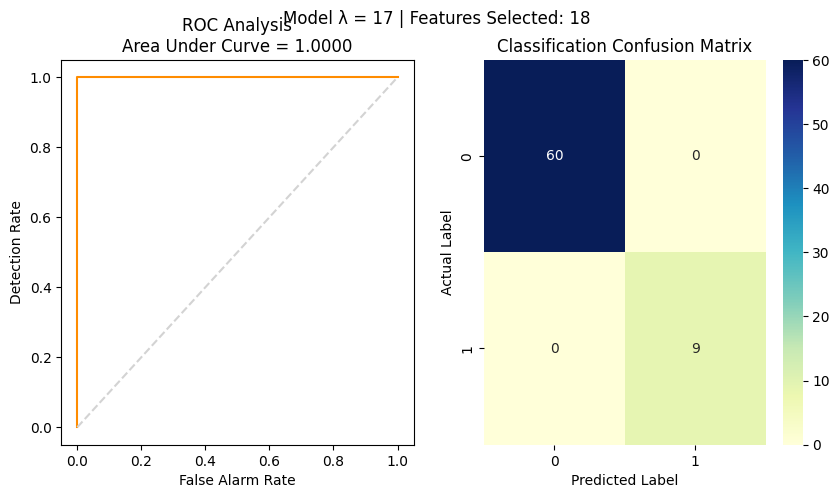

l = 17, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32',
       '3rd_quart_avg_rss32', 'max_avg_rss13', 'min_avg_rss33',
       'mean_avg_rss33', 'median_avg_rss33', '3rd_quart_avg_rss33',
       'min_avg_rss35', 'max_avg_rss19', '3rd_quart_avg_rss110',
       'max_avg_rss111', 'max_avg_rss112', 'max_avg_rss113', 'max_avg_rss215',
       '3rd_quart_avg_rss215', 'min_avg_rss315'],
      dtype='object')
    Model Params
0       0.059510
1      -0.012582
2       0.058772
3       0.050566
4      -0.007875
5       0.219231
6       0.047500
7       0.151612
8       0.042029
9       0.073481
10     -0.102712
11     -0.106170
12     -0.121831
13     -0.030301
14     -0.025499
15     -0.023550
16     -0.028674
17      0.243457


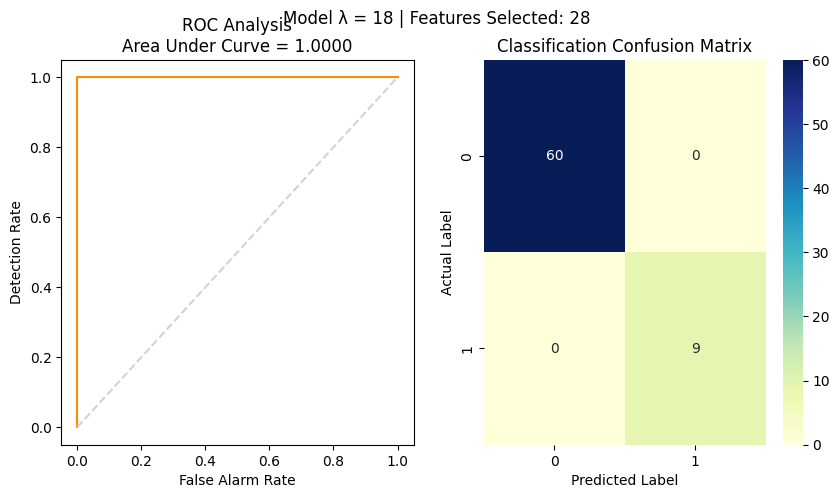

l = 18, Number of Relevant Features = 28, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32',
       'max_avg_rss13', 'min_avg_rss33', 'mean_avg_rss33', 'median_avg_rss33',
       '1st_quart_avg_rss33', 'max_avg_rss15', 'min_avg_rss35',
       'max_avg_rss19', 'max_avg_rss110', '3rd_quart_avg_rss110',
       'max_avg_rss111', 'median_avg_rss111', '3rd_quart_avg_rss111',
       'max_avg_rss112', '3rd_quart_avg_rss112', 'max_avg_rss113',
       '3rd_quart_avg_rss113', 'max_avg_rss114', '3rd_quart_avg_rss114',
       'min_avg_rss315', 'max_avg_rss216', '3rd_quart_avg_rss216',
       'min_avg_rss316', 'min_avg_rss317'],
      dtype='object')
    Model Params
0      -0.003076
1       0.025217
2      -0.021939
3       0.128653
4      -0.025685
5       0.149464
6       0.056260
7       0.070066
8       0.148270
9      -0.004745
10      0.146765
11     -0.051310
12     -0.061583
13     -0.026417
14     -0.028052
15     -0.020827
16     -0.026543
17     -0.0417

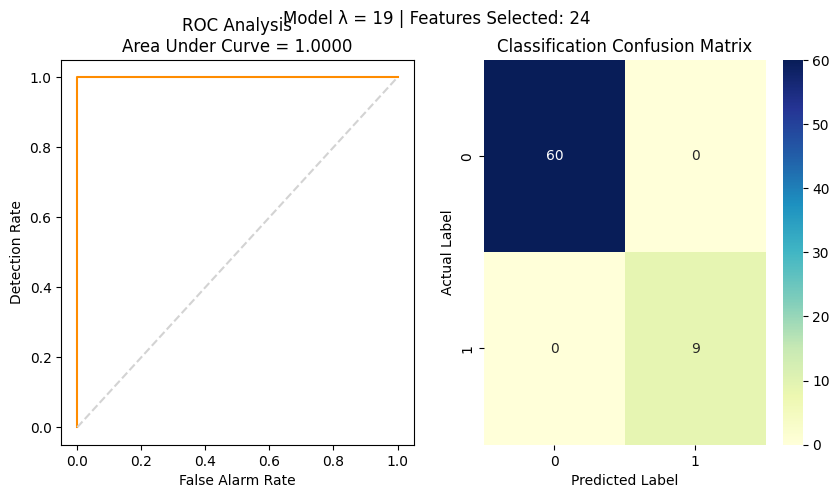

l = 19, Number of Relevant Features = 24, Features:
 Index(['min_avg_rss32', 'min_avg_rss33', 'mean_avg_rss33', 'median_avg_rss33',
       '1st_quart_avg_rss33', 'min_avg_rss36', 'max_avg_rss28',
       'max_avg_rss19', 'max_avg_rss110', 'max_avg_rss111', 'mean_avg_rss111',
       'median_avg_rss111', '3rd_quart_avg_rss111', 'max_avg_rss112',
       '3rd_quart_avg_rss112', 'max_avg_rss113', '3rd_quart_avg_rss113',
       'max_avg_rss114', '3rd_quart_avg_rss114', 'max_avg_rss115',
       '3rd_quart_avg_rss115', 'max_avg_rss217', 'min_avg_rss317',
       'max_avg_rss118'],
      dtype='object')
    Model Params
0       0.096499
1       0.217480
2       0.063228
3       0.040127
4       0.182745
5       0.065809
6      -0.010995
7      -0.015077
8      -0.037664
9      -0.052553
10     -0.004989
11     -0.014782
12     -0.047874
13     -0.026568
14     -0.015326
15     -0.037533
16     -0.014255
17     -0.030125
18     -0.020428
19     -0.025325
20     -0.009077
21     -0.079508
22      0

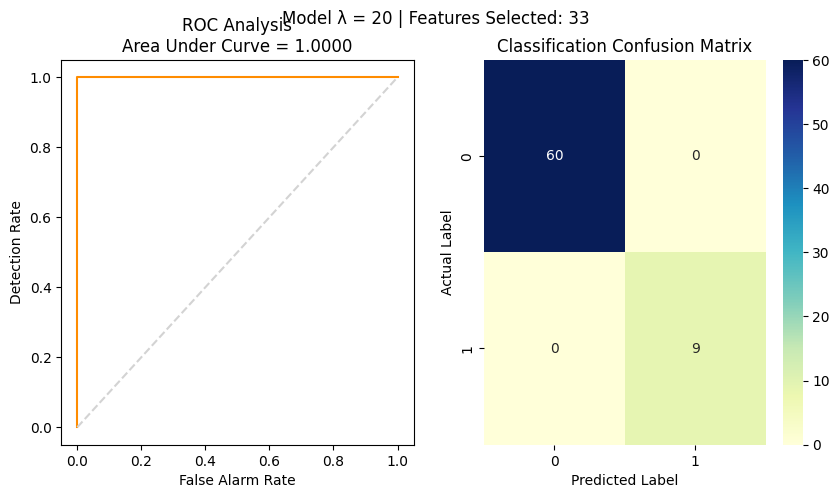

l = 20, Number of Relevant Features = 33, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32', 'max_avg_rss13',
       'min_avg_rss33', 'mean_avg_rss33', 'median_avg_rss33',
       '1st_quart_avg_rss33', 'max_avg_rss14', 'median_avg_rss34',
       '1st_quart_avg_rss34', 'max_avg_rss15', 'min_avg_rss36',
       'max_avg_rss19', 'max_avg_rss110', 'max_avg_rss111', 'max_avg_rss112',
       'mean_avg_rss112', 'median_avg_rss112', '3rd_quart_avg_rss112',
       'max_avg_rss113', '3rd_quart_avg_rss113', 'max_avg_rss114',
       '3rd_quart_avg_rss114', 'max_avg_rss115', '3rd_quart_avg_rss115',
       'max_avg_rss116', '3rd_quart_avg_rss116', 'max_avg_rss216',
       'min_avg_rss317', 'max_avg_rss218', 'min_avg_rss318', 'min_avg_rss319'],
      dtype='object')
    Model Params
0       0.020947
1      -0.020844
2       0.087599
3      -0.015456
4       0.239274
5       0.039518
6       0.048836
7       0.109754
8      -0.000080
9       0.037166
10      0.013503
11     -0.001933


In [25]:
X_reduced_train = {}
X_reduced_test = {}
model = LogisticRegression(penalty='l1', solver='liblinear', max_iter=100)

for l in range(1, 21, 1):
    model.fit(X_train[l], Y_train)
    Y_pred = model.predict(X_train[l])

    indicies = [i for i in range(len(model.coef_[0])) if model.coef_[0][i] != 0]
    X_reduced_train[l] = X_train[l].iloc[:, indicies]
    X_reduced_test[l] = X_test[l].iloc[:, indicies]


    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f'Model λ = {l} | Features Selected: {len(indicies)}')
    FPR, TPR, thresholds = roc_curve(Y_train, Y_pred) 
    ax1.plot(FPR, TPR, color="darkorange")
    ax1.plot([0, 1], [0, 1], linestyle='--', color="lightgray")
    ax1.set(xlabel="False Alarm Rate", ylabel="Detection Rate")
    ax1.set_title(f'ROC Analysis\nArea Under Curve = {roc_auc_score(Y_train, Y_pred):.4f}')
    sns.heatmap(confusion_matrix(Y_train, Y_pred), annot=True, cmap="YlGnBu", ax=ax2)
    ax2.set(xlabel="Predicted Label", ylabel="Actual Label")
    ax2.set_title("Classification Confusion Matrix")
    plt.show()
    
    print(f'l = {l}, Number of Relevant Features = {len(indicies)}, Features:\n', X_reduced_train[l].columns)
    print(pd.DataFrame({"Model Params": model.coef_[0][indicies]}))


In [26]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_reduced_train[l], Y_train, cv=5))
    model.fit(X_reduced_train[l], Y_train)
    Y_pred = model.predict(X_reduced_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')


l = 1
Cross Validation Scores: [0.85714286 1.         0.92857143 1.         1.        ]
Test Accuracy: 1.0000
l = 2
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 3
Cross Validation Scores: [0.85714286 1.         1.         0.92857143 1.        ]
Test Accuracy: 1.0000
l = 4
Cross Validation Scores: [0.92857143 1.         1.         0.92857143 1.        ]
Test Accuracy: 0.9474
l = 5
Cross Validation Scores: [0.92857143 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 6
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 7
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 0.9474
l = 8
Cross Validation Scores: [0.85714286 1.         1.         0.92857143 1.        ]
Test Accuracy: 0.9474
l = 9
Cross Validation Scores: [0.85714286 1.         1.         0.92857143 1.        ]
Test Accuracy: 0.9474
l = 10
Cro

In [27]:
Y_train = []
Y_test = []
for i,a in enumerate(csv_files):
    if 'dataset1.csv' in a or 'dataset2.csv' in a or 'dataset3.csv' in a:
        if 'dataset3' in a and 'bending' in a:
            Y_train.append(a.split('/')[1])
        else:
            Y_test.append(a.split('/')[1])
    else:
        Y_train.append(a.split('/')[1])

Y_train = np.array(Y_train)
Y_test = np.array(Y_test)
label_binarizer = LabelBinarizer().fit(Y_train)
Y_onehot_test = label_binarizer.transform(Y_test)
Y_onehot_train = label_binarizer.transform(Y_train)

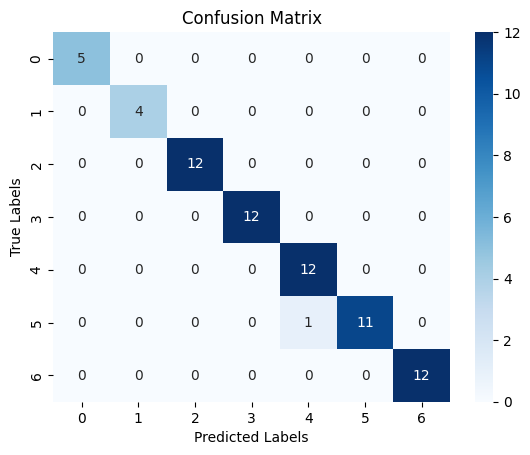

l = 1, Number of Relevant Features = 9, Features:
 Index(['min_avg_rss11', 'max_avg_rss11', '3rd_quart_avg_rss11',
       'min_avg_rss21', 'max_var_rss21', 'min_avg_rss31', 'max_avg_rss31',
       '1st_quart_avg_rss31', 'max_var_rss31'],
      dtype='object')
   Model Params
0     -0.038359
1     -0.102223
2     -0.077731
3      0.250648
4      0.026369
5      0.190936
6      0.118412
7      0.393183
8     -1.023374


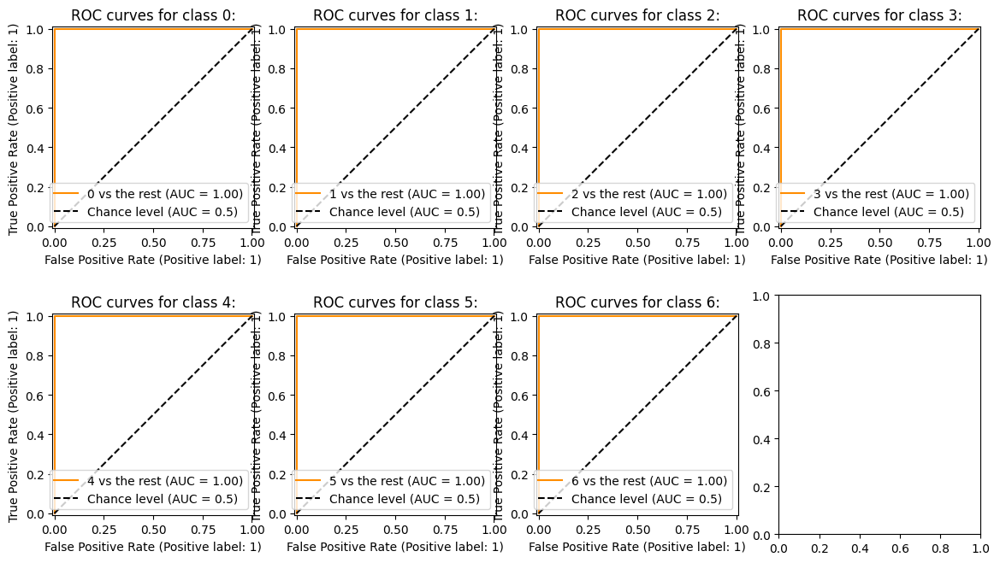

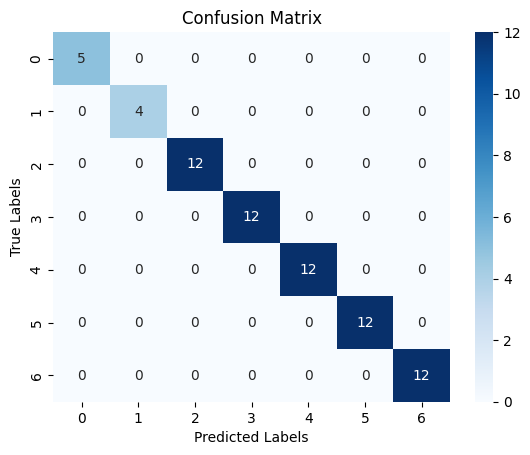

l = 2, Number of Relevant Features = 10, Features:
 Index(['max_avg_rss11', 'min_avg_rss21', 'max_avg_rss21', 'min_avg_rss31',
       'max_avg_rss31', '1st_quart_avg_rss31', 'max_var_rss31',
       '3rd_quart_avg_rss12', '3rd_quart_avg_rss22', '1st_quart_avg_rss32'],
      dtype='object')
   Model Params
0     -0.230185
1      0.234000
2      0.122859
3      0.167146
4      0.205339
5      0.001259
6     -0.663284
7     -0.056084
8     -0.200421
9      0.338998


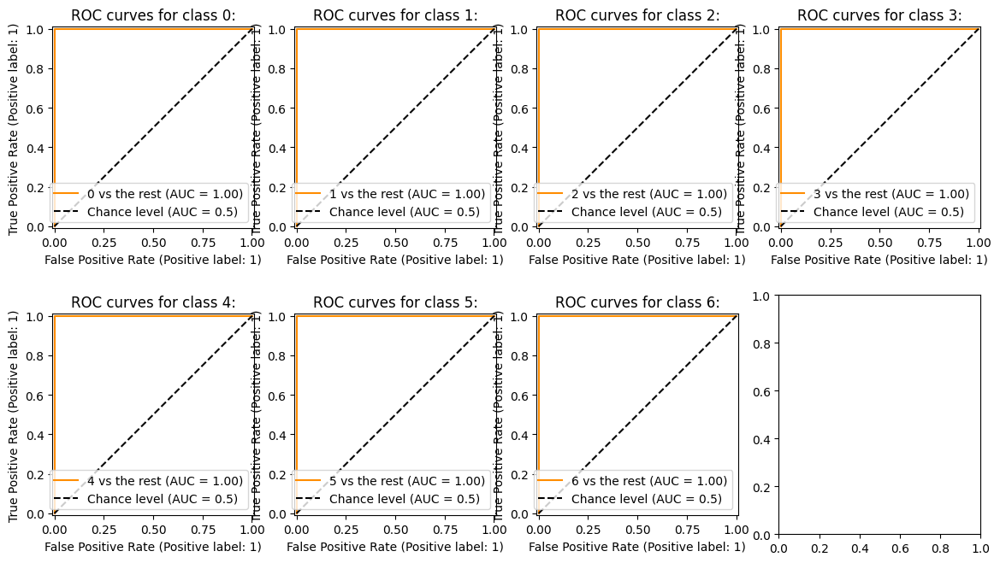

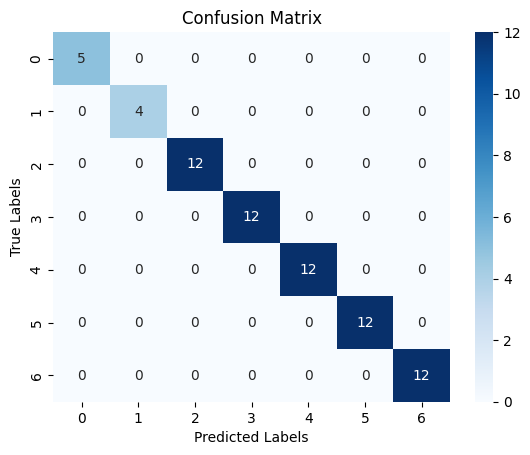

l = 3, Number of Relevant Features = 10, Features:
 Index(['max_avg_rss11', 'max_var_rss11', 'min_avg_rss21', 'max_avg_rss21',
       'min_avg_rss31', 'max_avg_rss31', 'max_var_rss31', 'min_avg_rss32',
       '3rd_quart_avg_rss23', '1st_quart_avg_rss33'],
      dtype='object')
   Model Params
0     -0.284181
1     -0.022821
2      0.136847
3      0.223830
4      0.297852
5      0.159639
6     -0.628522
7      0.037063
8     -0.169762
9      0.164085


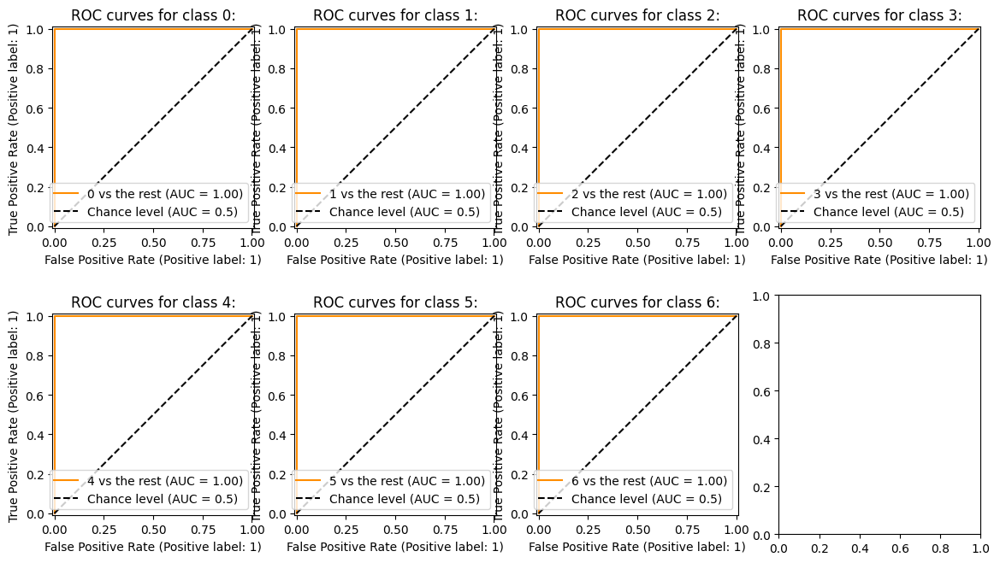

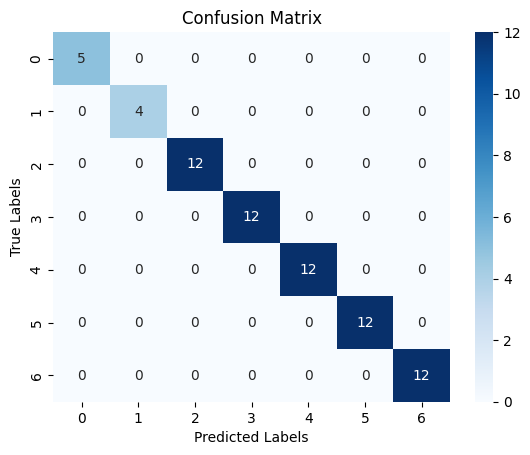

l = 4, Number of Relevant Features = 11, Features:
 Index(['max_avg_rss11', 'max_avg_rss21', 'max_var_rss31', 'mean_avg_rss22',
       'median_avg_rss22', '3rd_quart_avg_rss13', '1st_quart_avg_rss23',
       'min_avg_rss33', '3rd_quart_avg_rss24', 'min_avg_rss34',
       'max_avg_rss34'],
      dtype='object')
    Model Params
0      -0.224980
1       0.208103
2      -0.333177
3       0.031546
4       0.151600
5      -0.076364
6       0.036321
7       0.564369
8      -0.162480
9      -0.003495
10     -0.035697


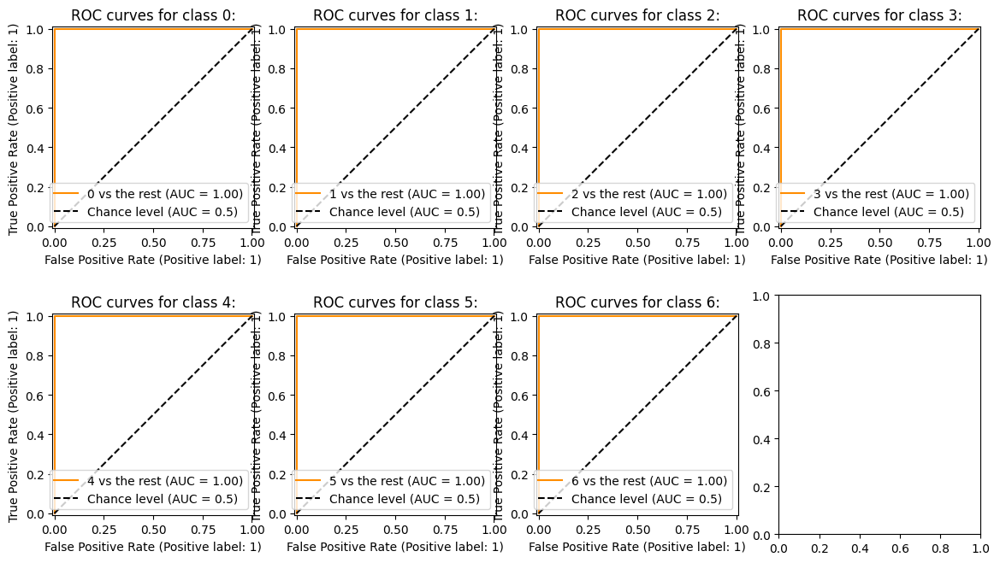

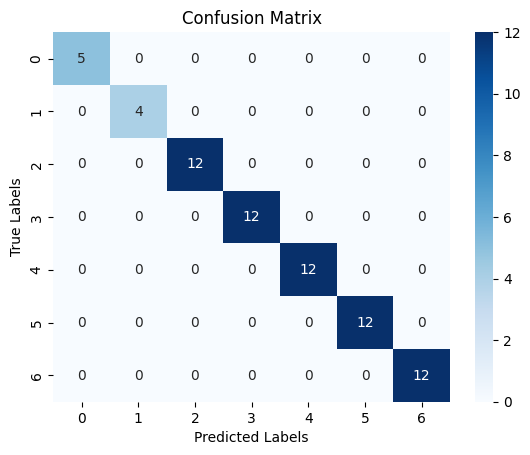

l = 5, Number of Relevant Features = 9, Features:
 Index(['max_avg_rss31', 'max_var_rss31', 'max_avg_rss12',
       '1st_quart_avg_rss22', 'min_avg_rss32', 'max_avg_rss32',
       'min_avg_rss14', 'min_avg_rss34', '3rd_quart_avg_rss25'],
      dtype='object')
   Model Params
0      0.452331
1     -0.773692
2     -0.180343
3      0.036013
4      0.207498
5     -0.058149
6     -0.079926
7      0.050309
8     -0.138917


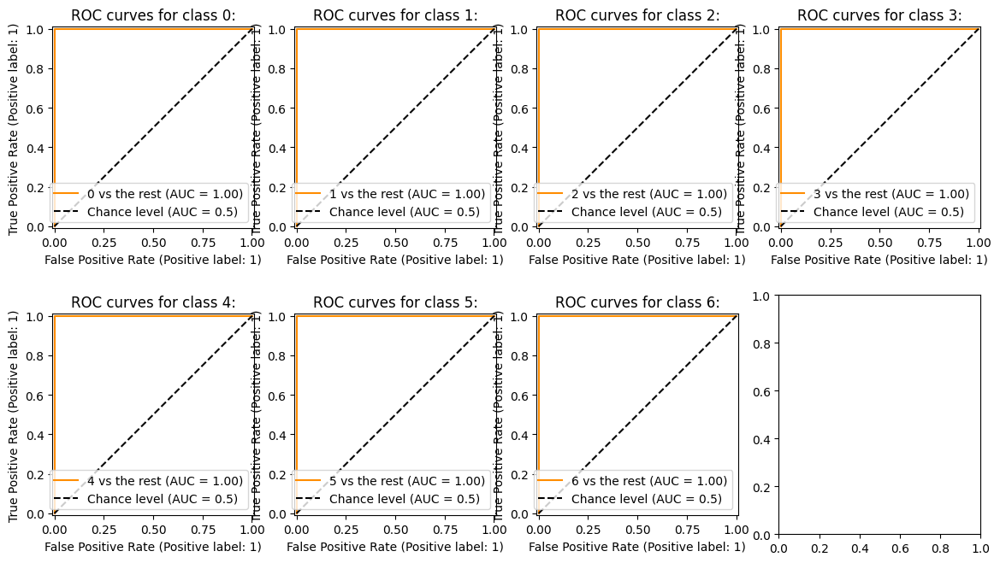

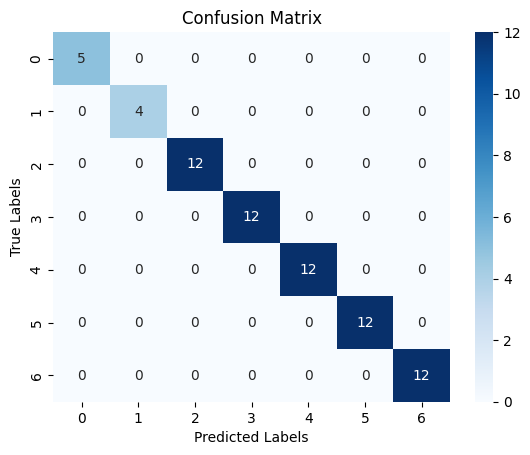

l = 6, Number of Relevant Features = 10, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'max_var_rss31', 'max_avg_rss12',
       'min_avg_rss22', 'min_avg_rss13', 'max_avg_rss13', 'min_avg_rss23',
       'min_avg_rss34', 'max_avg_rss15'],
      dtype='object')
   Model Params
0     -0.086160
1      0.241559
2     -0.540456
3     -0.110181
4      0.137194
5     -0.086110
6     -0.052708
7      0.110623
8      0.425124
9     -0.009156


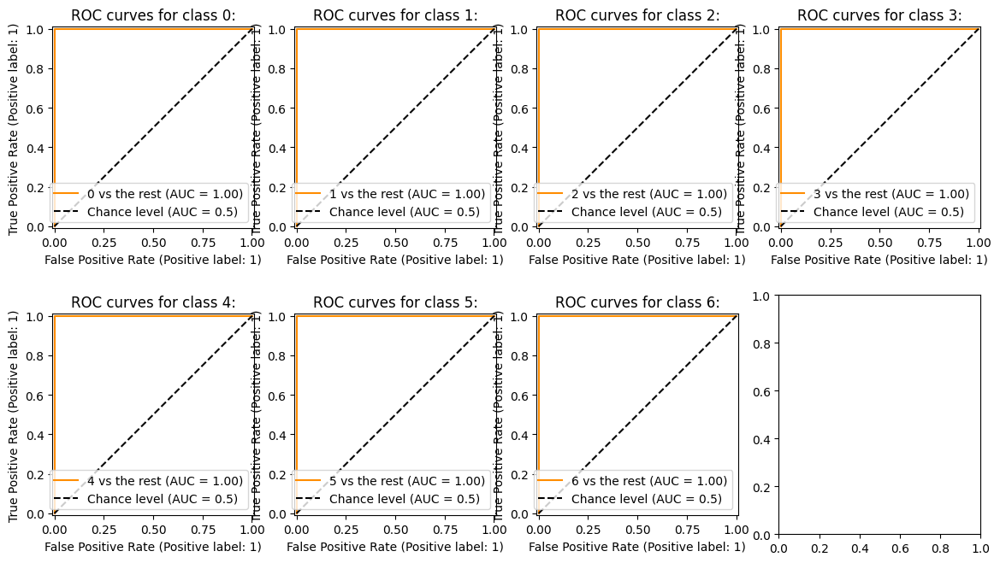

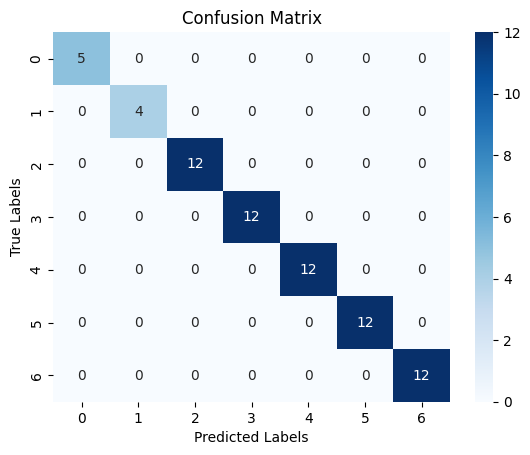

l = 7, Number of Relevant Features = 10, Features:
 Index(['max_avg_rss31', 'max_var_rss31', 'max_avg_rss12', 'min_avg_rss23',
       'min_avg_rss33', 'max_avg_rss15', 'min_avg_rss25', 'max_avg_rss25',
       'min_avg_rss35', 'min_avg_rss36'],
      dtype='object')
   Model Params
0      0.314990
1     -0.406252
2     -0.215161
3      0.332162
4      0.074304
5     -0.063214
6      0.034399
7     -0.178834
8      0.015145
9      0.183288


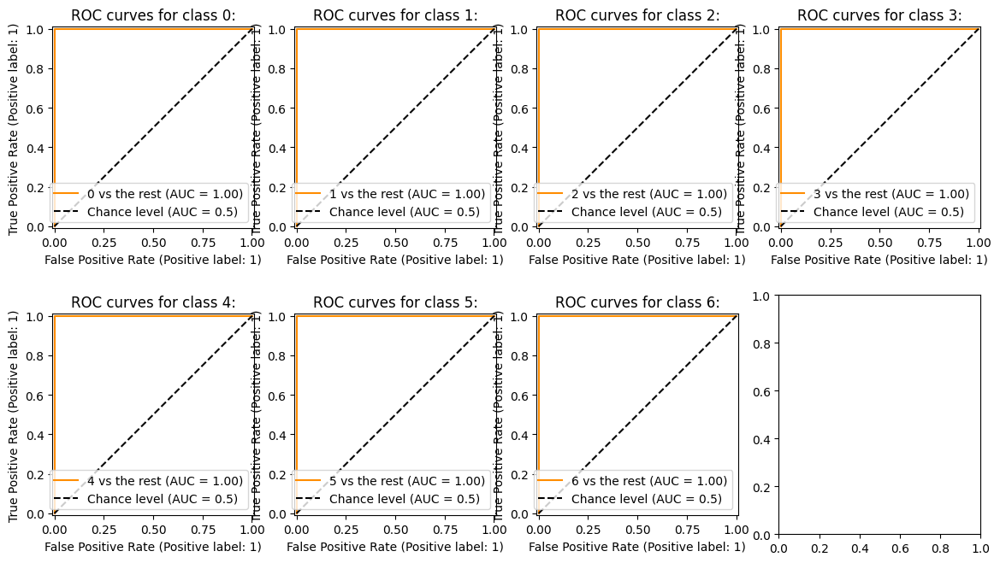

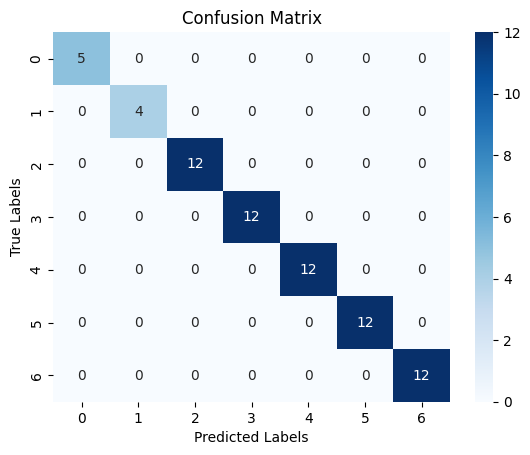

l = 8, Number of Relevant Features = 12, Features:
 Index(['max_avg_rss11', 'max_avg_rss21', 'max_var_rss31', 'max_avg_rss12',
       '1st_quart_avg_rss23', 'min_avg_rss33', 'max_avg_rss14',
       'max_avg_rss15', 'min_avg_rss25', 'min_avg_rss35', 'min_avg_rss26',
       '3rd_quart_avg_rss28'],
      dtype='object')
    Model Params
0      -0.084963
1       0.035727
2      -0.226141
3      -0.148958
4       0.205203
5       0.158969
6      -0.004932
7      -0.091127
8      -0.023974
9       0.428927
10      0.221457
11     -0.052488


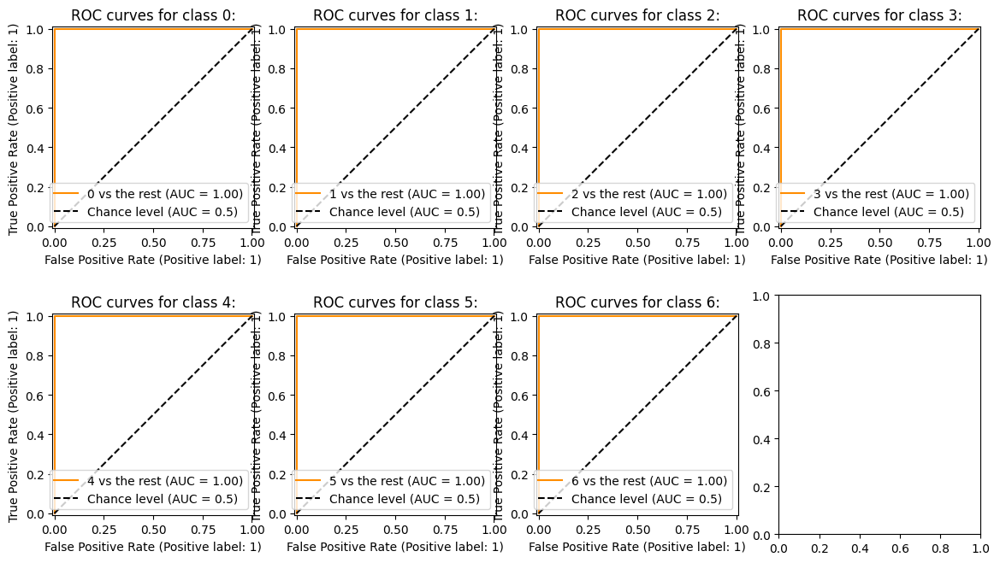

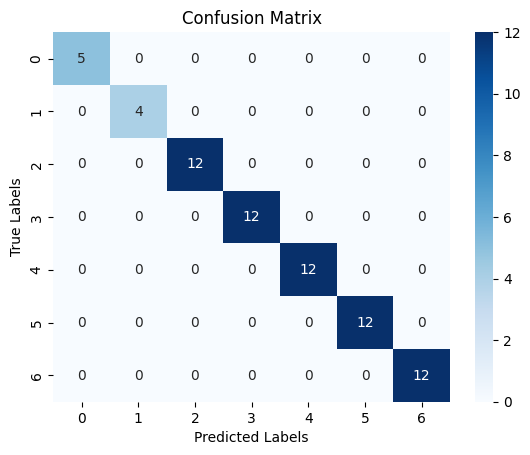

l = 9, Number of Relevant Features = 14, Features:
 Index(['max_avg_rss11', 'max_avg_rss21', '1st_quart_avg_rss21',
       'max_avg_rss12', '3rd_quart_avg_rss12', '1st_quart_avg_rss23',
       'min_avg_rss33', 'max_avg_rss14', '1st_quart_avg_rss24',
       'min_avg_rss15', 'max_avg_rss16', 'max_avg_rss26', 'min_avg_rss36',
       'max_avg_rss19'],
      dtype='object')
    Model Params
0      -0.050609
1       0.046534
2       0.081693
3      -0.119685
4      -0.010070
5       0.116539
6       0.575850
7      -0.009844
8       0.043578
9      -0.033413
10     -0.171427
11     -0.046147
12      0.176378
13     -0.006728


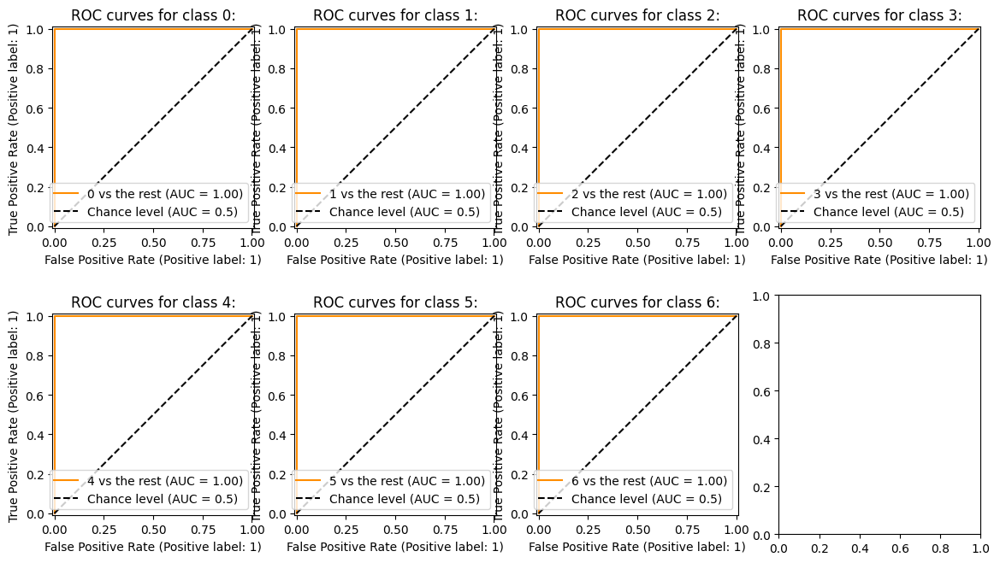

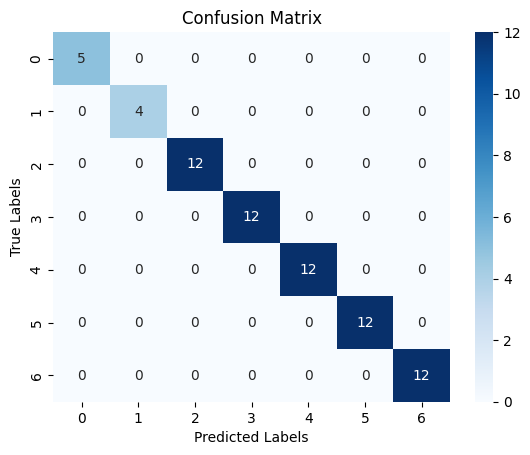

l = 10, Number of Relevant Features = 12, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', '1st_quart_avg_rss32',
       'max_var_rss32', 'max_avg_rss13', 'median_avg_rss24', 'min_avg_rss15',
       'min_avg_rss36', 'max_avg_rss17', 'min_avg_rss27', 'min_avg_rss18',
       'median_avg_rss29'],
      dtype='object')
    Model Params
0       0.215106
1      -0.027528
2       0.080883
3      -0.480866
4      -0.154176
5       0.072433
6      -0.035913
7       0.367357
8      -0.135200
9       0.096073
10     -0.000304
11     -0.003218


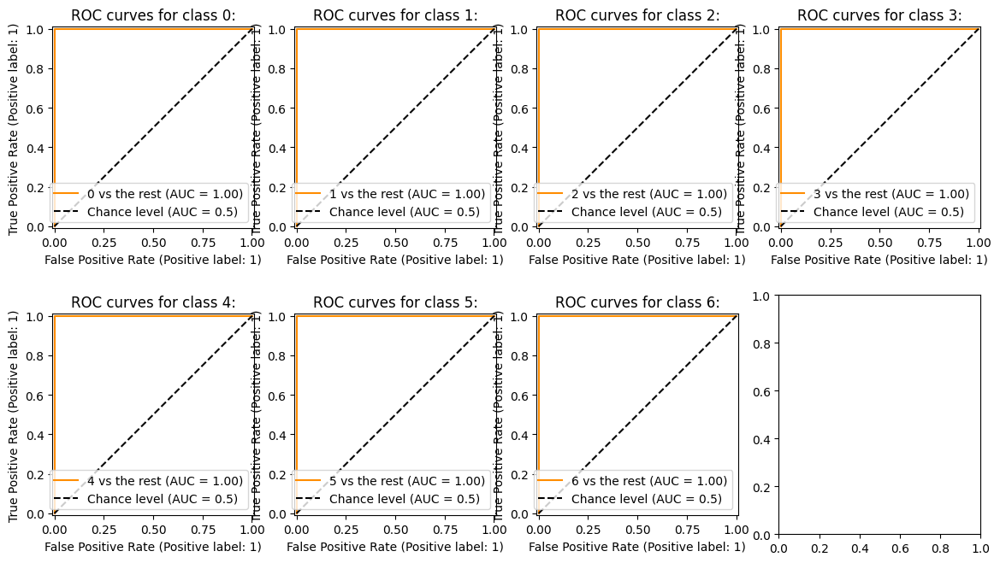

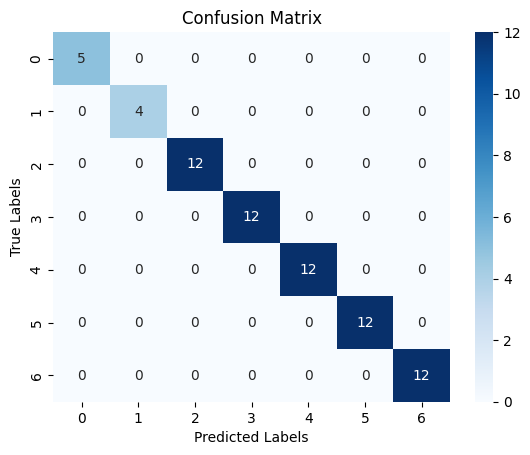

l = 11, Number of Relevant Features = 12, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'max_avg_rss13', 'min_avg_rss24',
       '1st_quart_avg_rss24', 'min_avg_rss34', 'max_avg_rss17',
       'max_avg_rss27', 'min_avg_rss37', 'min_avg_rss28',
       '3rd_quart_avg_rss210', 'max_avg_rss111'],
      dtype='object')
    Model Params
0      -0.010143
1       0.370015
2      -0.127643
3       0.202351
4       0.000379
5       0.123885
6      -0.104671
7      -0.109054
8       0.127682
9       0.145630
10     -0.093258
11     -0.015802


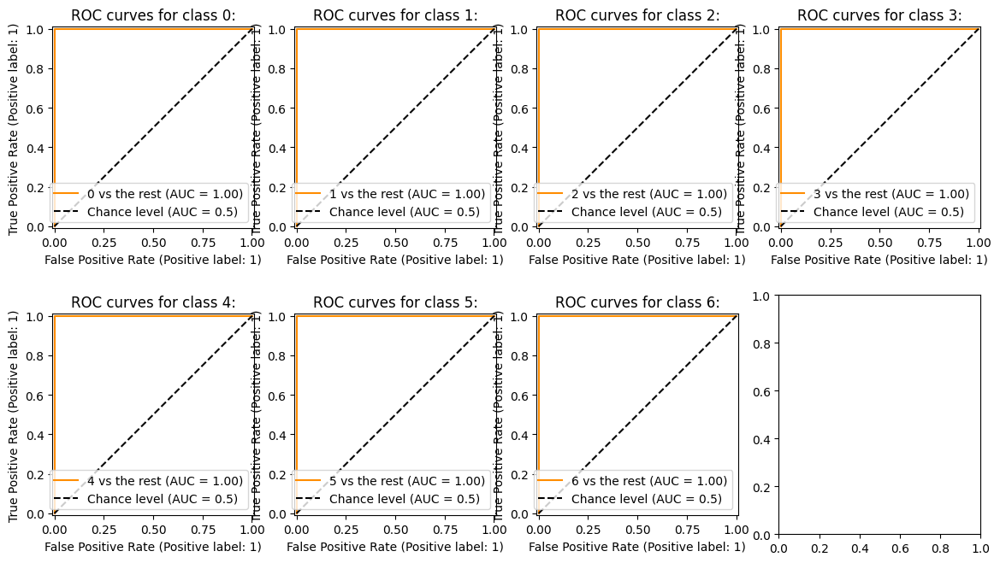

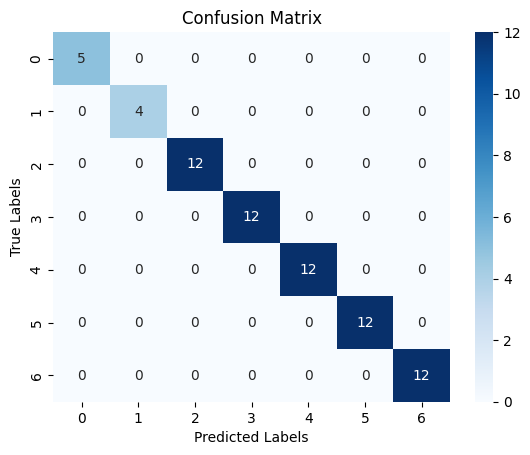

l = 12, Number of Relevant Features = 14, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'max_avg_rss13',
       '1st_quart_avg_rss24', 'min_avg_rss34', 'min_avg_rss16',
       'max_avg_rss16', 'min_avg_rss37', 'max_avg_rss18', 'max_avg_rss28',
       'min_avg_rss38', 'min_avg_rss29', 'max_avg_rss110',
       '3rd_quart_avg_rss211'],
      dtype='object')
    Model Params
0      -0.004851
1       0.192846
2      -0.075020
3       0.142244
4       0.171793
5      -0.031216
6      -0.013855
7       0.107107
8      -0.107757
9      -0.128636
10      0.115561
11      0.290279
12     -0.032372
13     -0.171531


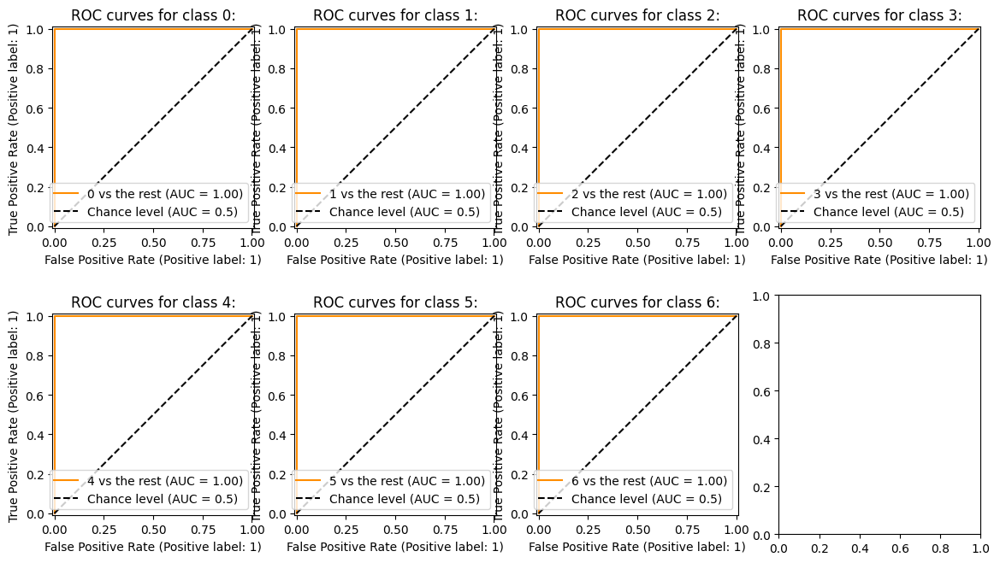

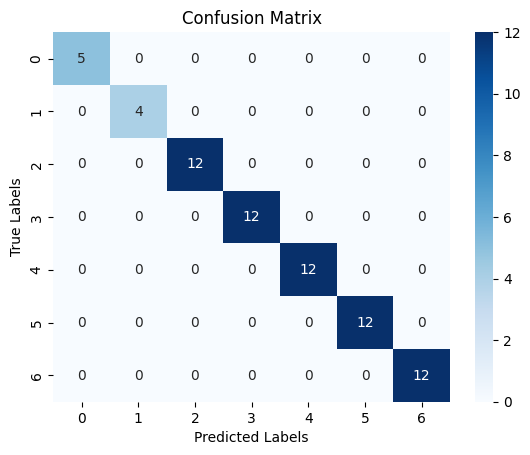

l = 13, Number of Relevant Features = 17, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'max_avg_rss13', 'max_avg_rss14',
       '1st_quart_avg_rss24', 'min_avg_rss34', 'max_avg_rss15',
       'min_avg_rss25', 'max_avg_rss16', 'min_avg_rss36', 'min_avg_rss17',
       'max_avg_rss18', 'min_avg_rss38', 'max_avg_rss19', 'min_avg_rss210',
       'max_avg_rss111', '3rd_quart_avg_rss212'],
      dtype='object')
    Model Params
0      -0.035797
1       0.136609
2      -0.047337
3      -0.038633
4       0.062260
5       0.347608
6      -0.031495
7       0.228258
8      -0.039769
9       0.049608
10     -0.051262
11     -0.036849
12      0.137253
13     -0.027817
14      0.087886
15     -0.012613
16     -0.188645


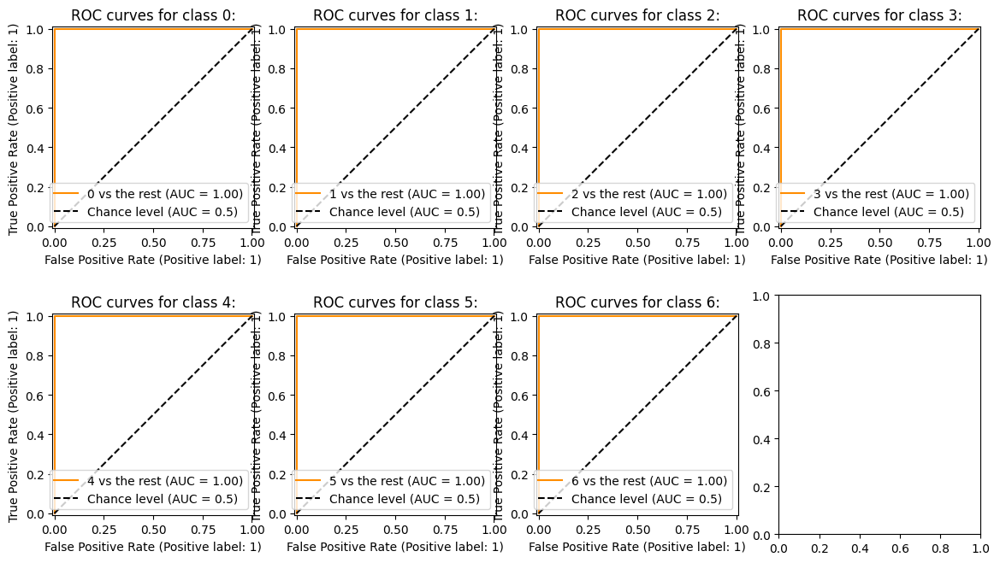

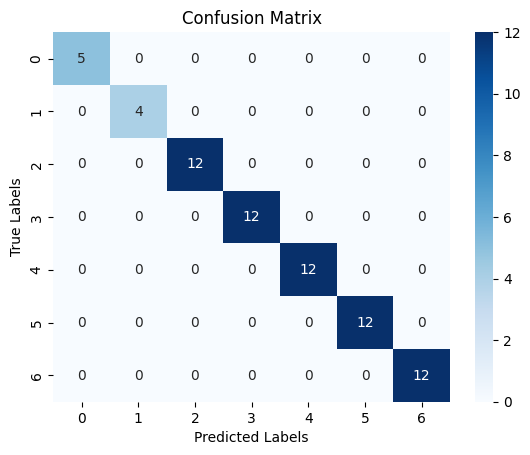

l = 14, Number of Relevant Features = 15, Features:
 Index(['min_avg_rss32', 'max_var_rss32', 'max_avg_rss13', 'max_avg_rss14',
       'min_avg_rss34', 'min_avg_rss25', 'min_avg_rss35', 'max_avg_rss16',
       'min_avg_rss28', 'max_avg_rss19', 'max_avg_rss29', 'min_avg_rss39',
       'min_avg_rss210', 'max_avg_rss213', '3rd_quart_avg_rss213'],
      dtype='object')
    Model Params
0       0.210426
1      -0.013526
2      -0.006371
3      -0.186529
4       0.246164
5       0.342136
6       0.062225
7      -0.027339
8      -0.021402
9      -0.098467
10     -0.041370
11      0.116851
12      0.045277
13     -0.020632
14     -0.037868


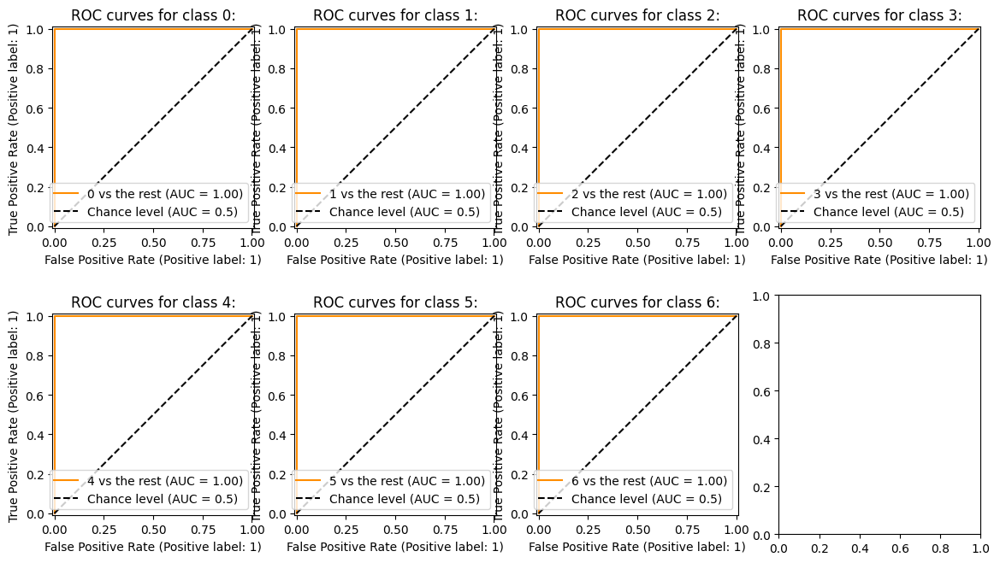

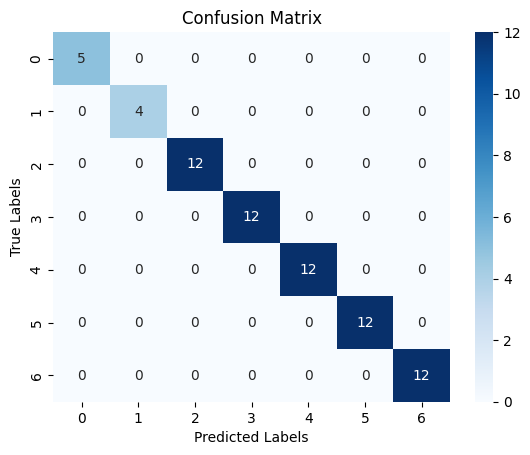

l = 15, Number of Relevant Features = 16, Features:
 Index(['3rd_quart_avg_rss22', 'min_avg_rss32', '1st_quart_avg_rss33',
       'max_avg_rss14', 'max_avg_rss15', 'min_avg_rss35', 'max_avg_rss16',
       '1st_quart_avg_rss26', 'max_avg_rss17', 'min_avg_rss18',
       'min_avg_rss39', 'max_avg_rss110', 'max_avg_rss210', 'min_avg_rss211',
       'max_avg_rss214', '3rd_quart_avg_rss214'],
      dtype='object')
    Model Params
0       0.018193
1       0.086326
2       0.054159
3      -0.035399
4      -0.022241
5       0.204116
6      -0.024902
7       0.210288
8      -0.056551
9      -0.084315
10      0.278228
11     -0.080729
12     -0.086514
13      0.183569
14     -0.062750
15     -0.149657


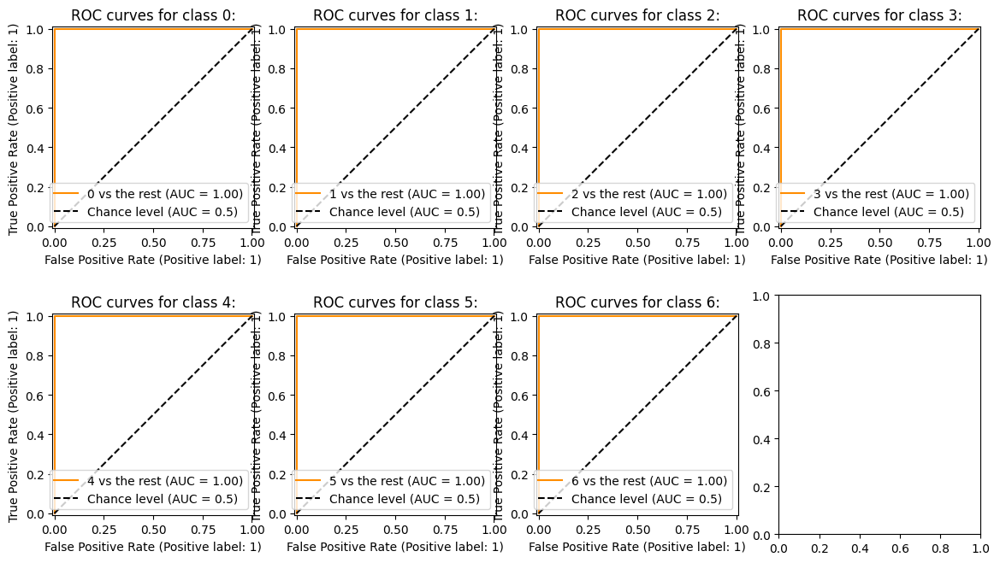

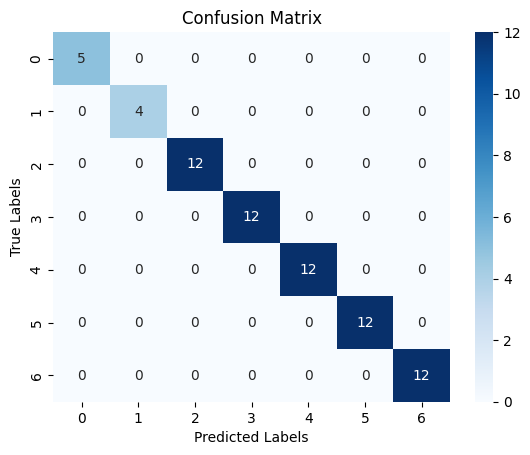

l = 16, Number of Relevant Features = 17, Features:
 Index(['max_avg_rss12', 'min_avg_rss33', 'max_avg_rss14',
       '1st_quart_avg_rss25', 'min_avg_rss35', 'min_avg_rss26',
       'median_avg_rss26', '1st_quart_avg_rss26', 'min_avg_rss18',
       'max_avg_rss110', 'max_avg_rss210', 'min_avg_rss310', 'max_avg_rss111',
       'min_avg_rss212', 'max_avg_rss113', 'max_avg_rss215',
       '3rd_quart_avg_rss215'],
      dtype='object')
    Model Params
0      -0.008791
1       0.191049
2      -0.061898
3       0.023917
4       0.138795
5       0.030163
6       0.062374
7       0.032027
8      -0.064556
9      -0.080326
10     -0.118090
11      0.219458
12     -0.025587
13      0.250441
14     -0.005295
15     -0.082940
16     -0.144260


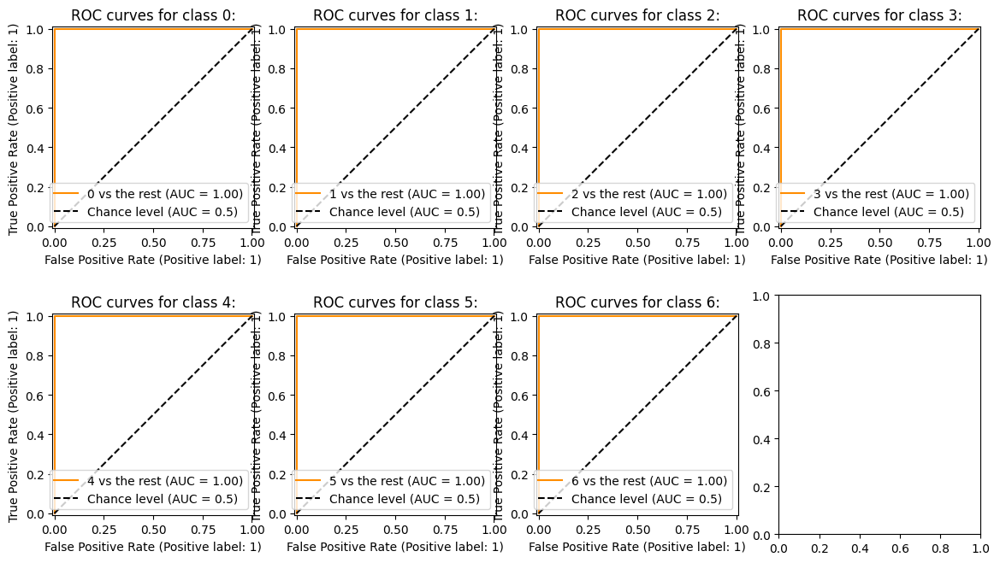

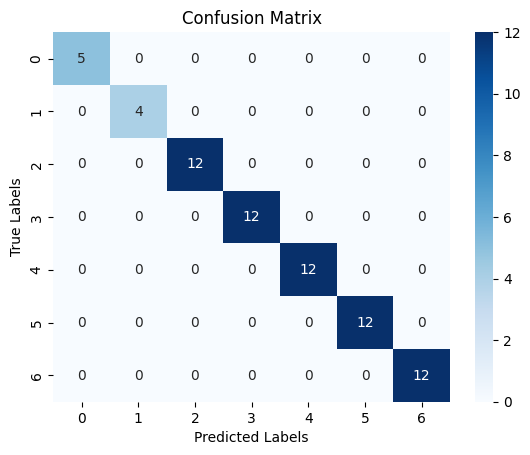

l = 17, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss33', 'max_avg_rss14',
       'min_avg_rss25', 'min_avg_rss35', 'max_avg_rss16', 'min_avg_rss26',
       'min_avg_rss36', 'max_avg_rss110', 'min_avg_rss310', 'max_avg_rss111',
       '3rd_quart_avg_rss111', 'max_avg_rss114', '3rd_quart_avg_rss215',
       'max_avg_rss116', 'min_avg_rss316', 'min_avg_rss317'],
      dtype='object')
    Model Params
0       0.000018
1      -0.043290
2       0.347730
3      -0.093454
4       0.039620
5       0.026147
6      -0.029913
7       0.286957
8       0.074659
9      -0.004857
10      0.193418
11     -0.098183
12     -0.013154
13     -0.035455
14     -0.087975
15     -0.006502
16      0.000295
17     -0.051510


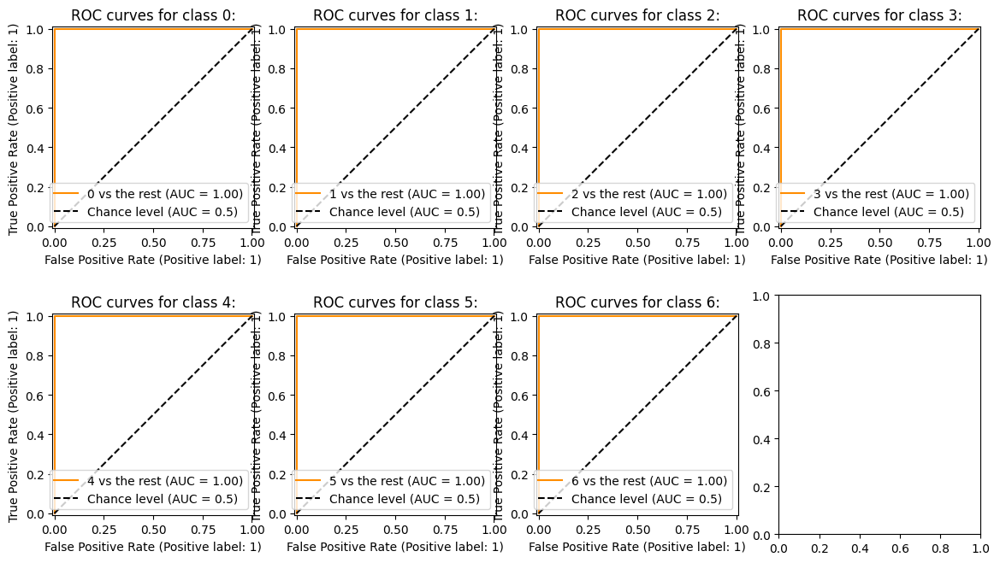

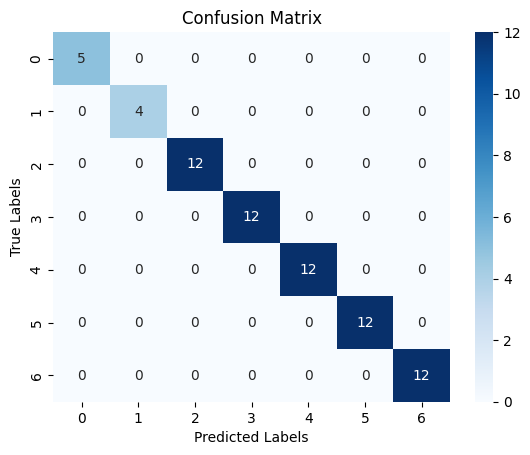

l = 18, Number of Relevant Features = 19, Features:
 Index(['max_avg_rss12', 'max_avg_rss13', 'min_avg_rss33', 'max_avg_rss14',
       'max_avg_rss15', 'min_avg_rss35', 'min_avg_rss26', 'min_avg_rss36',
       'min_avg_rss19', 'max_avg_rss111', 'max_avg_rss211', 'min_avg_rss311',
       'max_avg_rss112', 'max_avg_rss115', 'max_avg_rss215',
       '3rd_quart_avg_rss216', 'min_avg_rss317', 'min_avg_rss118',
       'min_avg_rss318'],
      dtype='object')
    Model Params
0      -0.007868
1      -0.021537
2       0.330658
3      -0.029987
4      -0.060311
5       0.043600
6       0.133416
7       0.210472
8      -0.014624
9      -0.114812
10     -0.090127
11      0.134968
12     -0.042648
13     -0.010865
14     -0.007675
15     -0.000105
16      0.018037
17     -0.001606
18     -0.066189


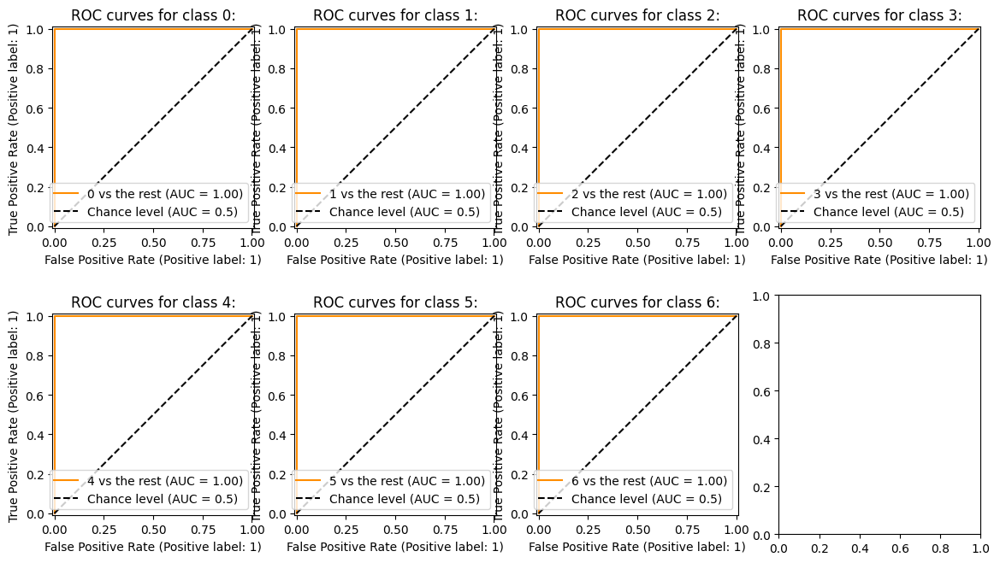

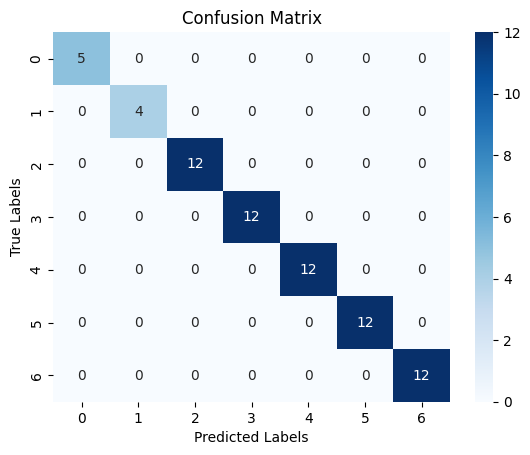

l = 19, Number of Relevant Features = 22, Features:
 Index(['min_avg_rss33', 'max_avg_rss15', 'max_avg_rss35', 'max_avg_rss16',
       '3rd_quart_avg_rss16', 'min_avg_rss26', 'min_avg_rss36',
       'min_avg_rss27', 'max_avg_rss18', 'median_avg_rss18', 'min_avg_rss311',
       'max_avg_rss112', '3rd_quart_avg_rss112', 'max_avg_rss212',
       'max_avg_rss113', 'min_avg_rss214', 'min_avg_rss115', 'max_avg_rss115',
       '1st_quart_avg_rss115', 'max_avg_rss215', 'max_avg_rss217',
       '3rd_quart_avg_rss217'],
      dtype='object')
    Model Params
0       0.313119
1      -0.040430
2      -0.024543
3      -0.048042
4      -0.032333
5       0.041417
6       0.098010
7       0.162941
8      -0.017450
9      -0.007968
10      0.269182
11     -0.059034
12     -0.008637
13     -0.041915
14     -0.036227
15      0.045832
16     -0.007492
17     -0.013134
18     -0.013395
19     -0.042049
20     -0.099972
21     -0.020246


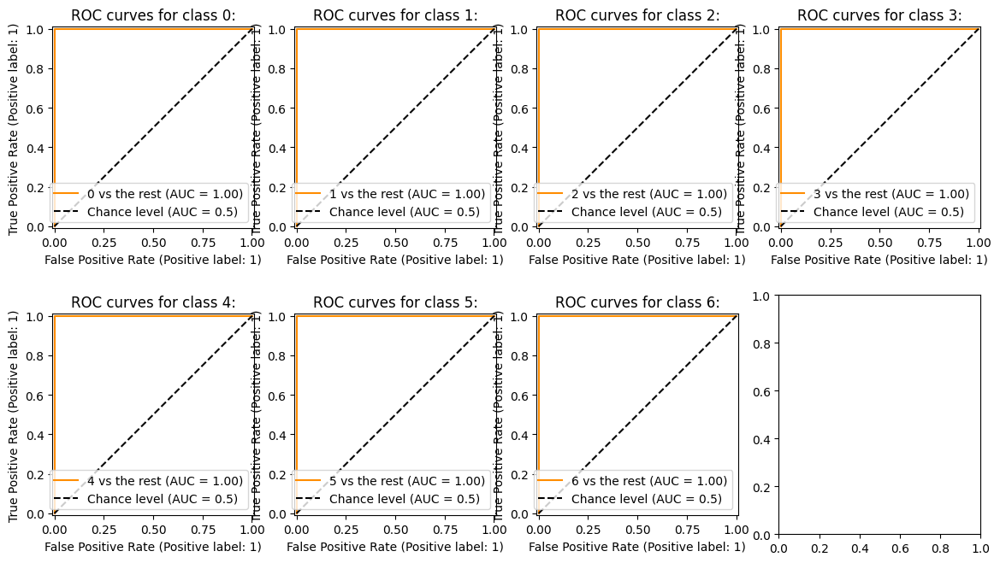

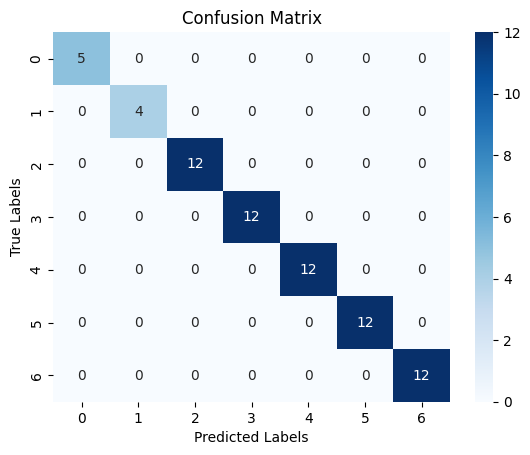

l = 20, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss13', 'min_avg_rss33', 'max_avg_rss15', 'min_avg_rss26',
       'max_avg_rss17', 'min_avg_rss27', 'min_avg_rss37', 'max_avg_rss19',
       'min_avg_rss110', 'min_avg_rss312', 'max_avg_rss113', 'max_avg_rss114',
       'min_avg_rss215', 'max_avg_rss116', 'max_avg_rss216', 'max_avg_rss117',
       'max_avg_rss119', 'max_avg_rss120'],
      dtype='object')
    Model Params
0      -0.016521
1       0.281798
2      -0.050946
3       0.012208
4      -0.006983
5       0.187473
6       0.203668
7      -0.000082
8      -0.020546
9       0.201858
10     -0.072743
11     -0.036537
12      0.023226
13     -0.028773
14     -0.225178
15     -0.025086
16     -0.011661
17     -0.008600


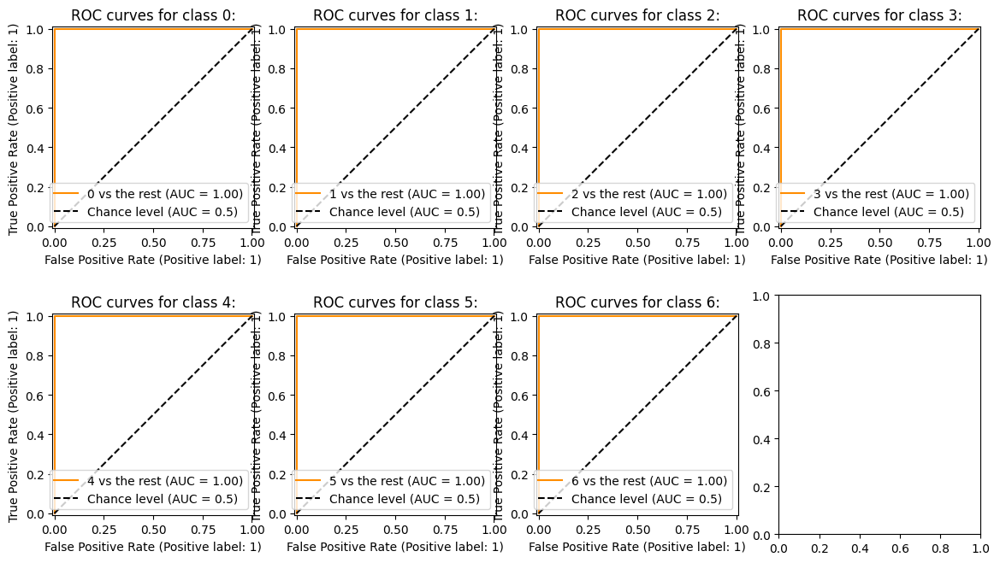

In [28]:
X_reduced_train = {}
X_reduced_test = {}
model = LogisticRegression(penalty='l1', solver='liblinear', max_iter=100)

for l in range(1, 21, 1):
    model.fit(X_train[l], Y_train)
    Y_pred = model.predict(X_train[l])
    Y_score = model.predict_log_proba(X_train[l])

    cm = confusion_matrix(Y_train, Y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

    fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14, 8))

    for i in range(len(cm)):
        RocCurveDisplay.from_predictions(
            Y_onehot_train[:, i],
            Y_score[:, i],
            ax=axs[i//4, i-4],
            name=f"{i} vs the rest",
            color="darkorange",
            plot_chance_level=True,
        )
        axs[i//4, i-4].set_title(f'ROC curves for class {i}:')
        axs[i//4, i-4].plot(
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
        )
    indicies = [i for i in range(len(model.coef_[0])) if model.coef_[0][i] != 0]
    X_reduced_train[l] = X_train[l].iloc[:, indicies]
    X_reduced_test[l] = X_test[l].iloc[:, indicies]
    
    print(f'l = {l}, Number of Relevant Features = {len(indicies)}, Features:\n', X_reduced_train[l].columns)
    print(pd.DataFrame({"Model Params": model.coef_[0][indicies]}))

In [29]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_reduced_train[l], Y_train, cv=5))
    model.fit(X_reduced_train[l], Y_train)
    Y_pred = model.predict(X_reduced_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')


l = 1
Cross Validation Scores: [0.71428571 0.85714286 0.64285714 0.71428571 0.76923077]
Test Accuracy: 0.6842
l = 2


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least 

Cross Validation Scores: [0.78571429 0.92857143 0.71428571 0.71428571 0.61538462]
Test Accuracy: 0.6842
l = 3
Cross Validation Scores: [0.92857143 0.78571429 0.57142857 0.78571429 0.84615385]
Test Accuracy: 0.7368
l = 4
Cross Validation Scores: [0.78571429 0.64285714 0.57142857 0.64285714 0.61538462]
Test Accuracy: 0.6842
l = 5
Cross Validation Scores: [0.78571429 0.78571429 0.71428571 0.64285714 0.69230769]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Test Accuracy: 0.6842
l = 6
Cross Validation Scores: [0.57142857 0.78571429 0.71428571 0.71428571 0.76923077]
Test Accuracy: 0.5263
l = 7
Cross Validation Scores: [0.42857143 0.64285714 0.42857143 0.57142857 0.53846154]
Test Accuracy: 0.6316
l = 8


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.57142857 0.78571429 0.78571429 0.57142857 0.46153846]
Test Accuracy: 0.4211
l = 9


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Cross Validation Scores: [0.71428571 0.85714286 0.57142857 0.71428571 0.61538462]
Test Accuracy: 0.6842
l = 10
Cross Validation Scores: [0.85714286 0.71428571 0.64285714 0.57142857 0.76923077]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Test Accuracy: 0.6316
l = 11
Cross Validation Scores: [0.5        0.71428571 0.42857143 0.5        0.46153846]
Test Accuracy: 0.4211
l = 12
Cross Validation Scores: [0.57142857 0.64285714 0.57142857 0.57142857 0.53846154]
Test Accuracy: 0.6316
l = 13


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.71428571 0.57142857 0.57142857 0.78571429 0.69230769]
Test Accuracy: 0.5789
l = 14
Cross Validation Scores: [0.42857143 0.57142857 0.57142857 0.57142857 0.46153846]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Test Accuracy: 0.5263
l = 15
Cross Validation Scores: [0.64285714 0.57142857 0.78571429 0.5        0.61538462]
Test Accuracy: 0.6316
l = 16


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.64285714 0.78571429 0.71428571 0.64285714 0.46153846]
Test Accuracy: 0.7368
l = 17


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Cross Validation Scores: [0.5        0.71428571 0.64285714 0.42857143 0.61538462]
Test Accuracy: 0.5789
l = 18


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.64285714 0.57142857 0.57142857 0.78571429 0.38461538]
Test Accuracy: 0.5263
l = 19


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.78571429 0.78571429 0.5        0.5        0.53846154]
Test Accuracy: 0.7368
l = 20
Cross Validation Scores: [0.57142857 0.5        0.57142857 0.64285714 0.46153846]
Test Accuracy: 0.5789


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


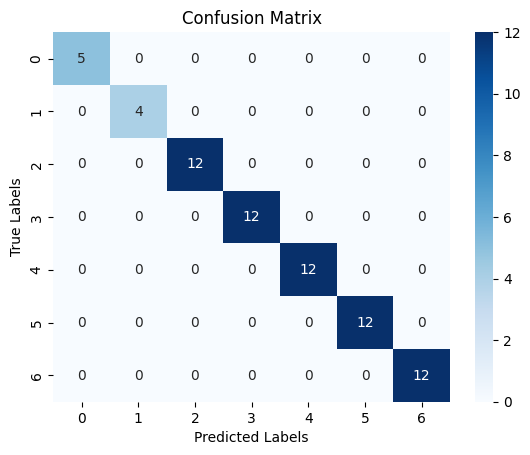

AttributeError: Line2D.set() got an unexpected keyword argument 'despine'

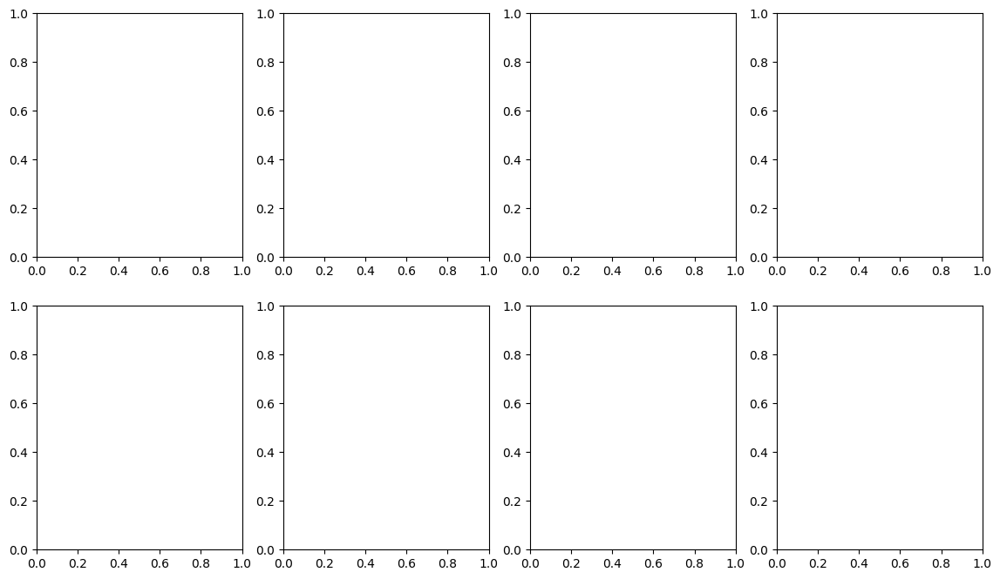

In [30]:
X_reduced_train = {}
X_reduced_test = {}
model = GaussianNB()

for l in range(1, 21, 1):
    model.fit(X_train[l], Y_train)

    Y_pred = model.predict(X_train[l])
    Y_score = model.predict_log_proba(X_train[l])

    cm = confusion_matrix(Y_train, Y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

    fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14, 8))

    for i in range(len(cm)):
        RocCurveDisplay.from_predictions(
            Y_onehot_train[:, i],
            Y_score[:, i],
            ax=axs[i//4, i-4],
            name=f"{i} vs the rest",
            color="darkorange",
            plot_chance_level=True,
            despine=True,
        )
        axs[i//4, i-4].set_title(f'ROC curves for class {i}:')
        axs[i//4, i-4].plot(
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
        )

In [ ]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_train[l], Y_train, cv=5))
    model.fit(X_train[l], Y_train)
    Y_pred = model.predict(X_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')


l = 1
Cross Validation Scores: [0.92857143 0.78571429 0.92857143 0.92857143 0.53846154]
Test Accuracy: 0.8947
l = 2
Cross Validation Scores: [0.85714286 0.78571429 0.85714286 0.78571429 0.92307692]
Test Accuracy: 0.6316
l = 3
Cross Validation Scores: [0.78571429 0.71428571 0.71428571 0.71428571 0.69230769]
Test Accuracy: 0.7368
l = 4
Cross Validation Scores: [0.71428571 0.78571429 0.71428571 0.57142857 0.53846154]
Test Accuracy: 0.7895
l = 5
Cross Validation Scores: [0.57142857 0.64285714 0.85714286 0.64285714 0.76923077]
Test Accuracy: 0.7895
l = 6
Cross Validation Scores: [0.57142857 0.71428571 0.64285714 0.71428571 0.69230769]
Test Accuracy: 0.6316
l = 7
Cross Validation Scores: [0.64285714 0.85714286 0.71428571 0.5        0.69230769]
Test Accuracy: 0.6842
l = 8
Cross Validation Scores: [0.78571429 0.78571429 0.64285714 0.64285714 0.61538462]
Test Accuracy: 0.7368
l = 9
Cross Validation Scores: [0.64285714 0.78571429 0.64285714 0.64285714 0.53846154]
Test Accuracy: 0.7895
l = 10
Cro

/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=

Test Accuracy: 0.6842
l = 14
Cross Validation Scores: [0.64285714 0.57142857 0.57142857 0.64285714 0.53846154]
Test Accuracy: 0.5789
l = 15
Cross Validation Scores: [0.57142857 0.64285714 0.5        0.64285714 0.53846154]
Test Accuracy: 0.5789
l = 16
Cross Validation Scores: [0.64285714 0.57142857 0.64285714 0.5        0.53846154]
Test Accuracy: 0.5263
l = 17
Cross Validation Scores: [0.57142857 0.64285714 0.57142857 0.5        0.61538462]
Test Accuracy: 0.5263
l = 18
Cross Validation Scores: [0.57142857 0.57142857 0.5        0.5        0.53846154]
Test Accuracy: 0.6316
l = 19
Cross Validation Scores: [0.64285714 0.57142857 0.5        0.5        0.53846154]
Test Accuracy: 0.6316
l = 20
Cross Validation Scores: [0.64285714 0.57142857 0.5        0.57142857 0.53846154]


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=

Test Accuracy: 0.5789


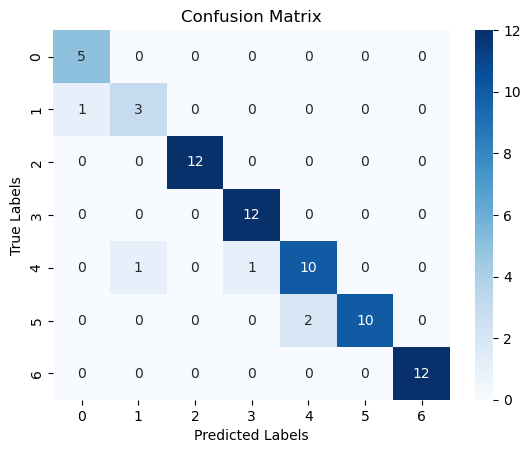

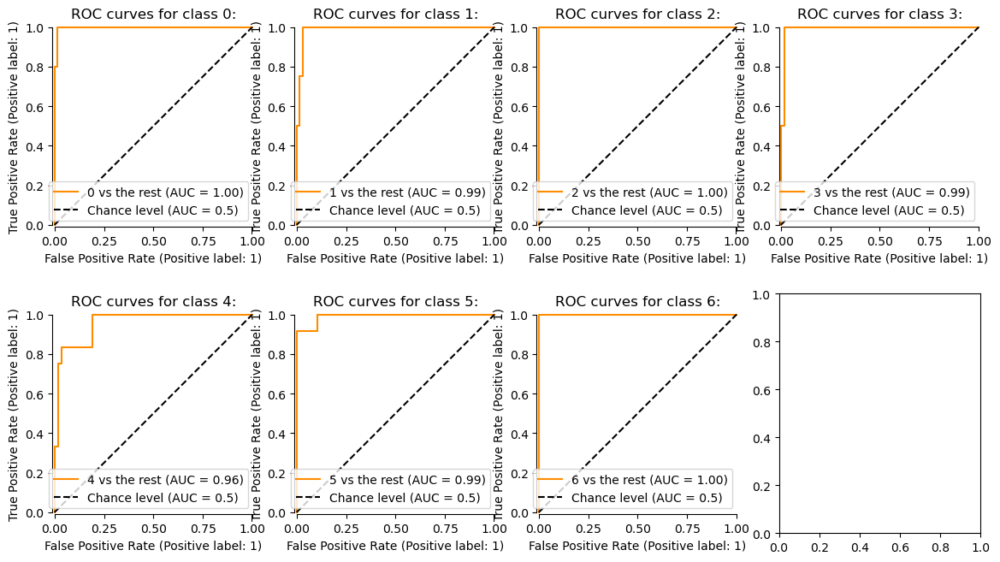

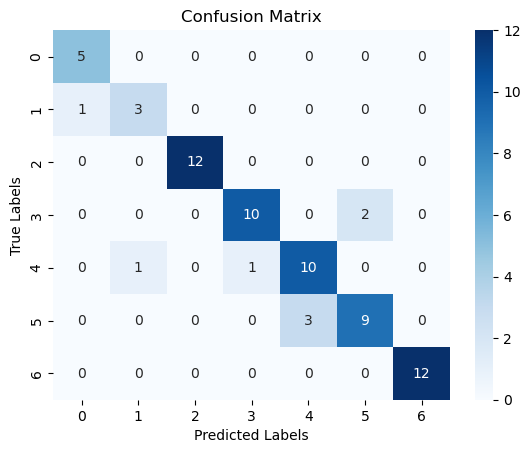

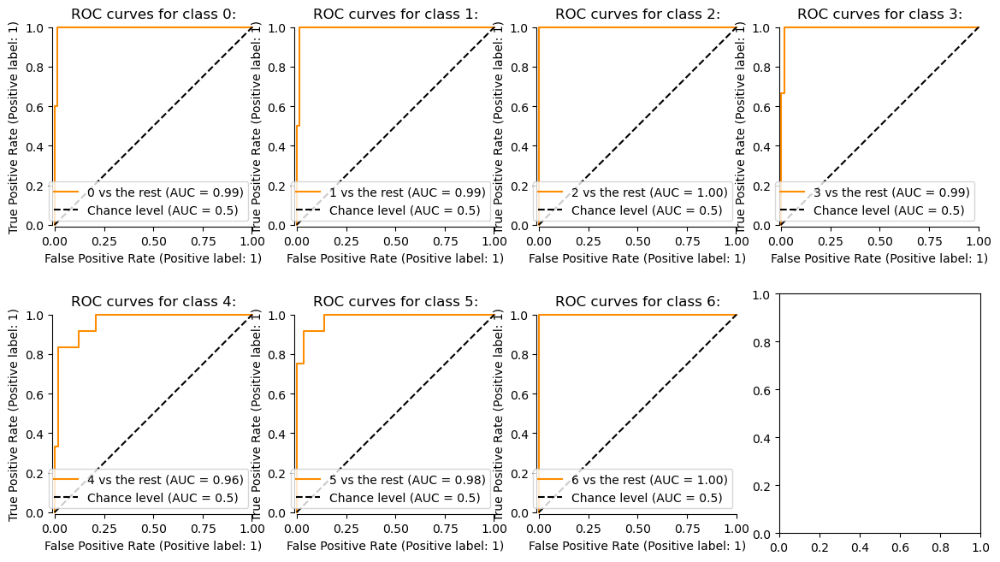

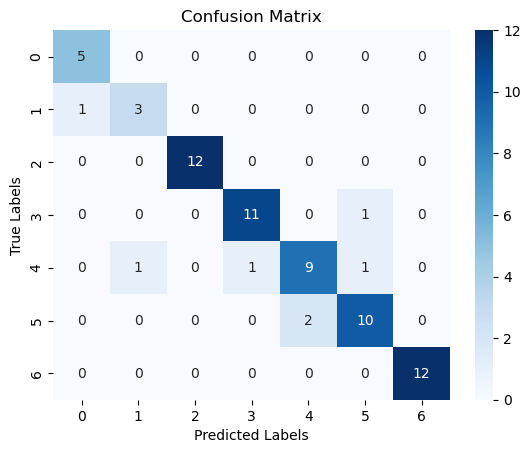

...

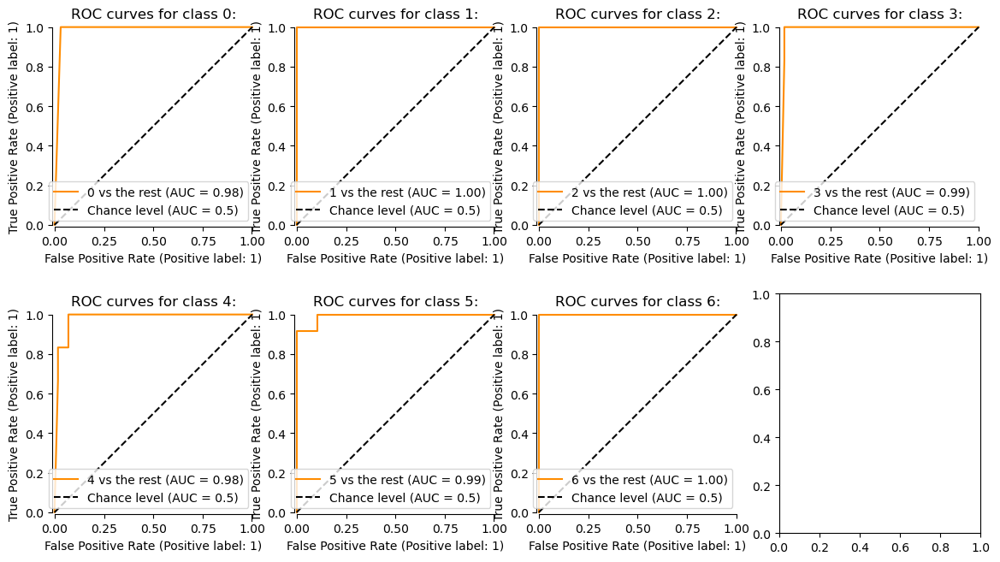

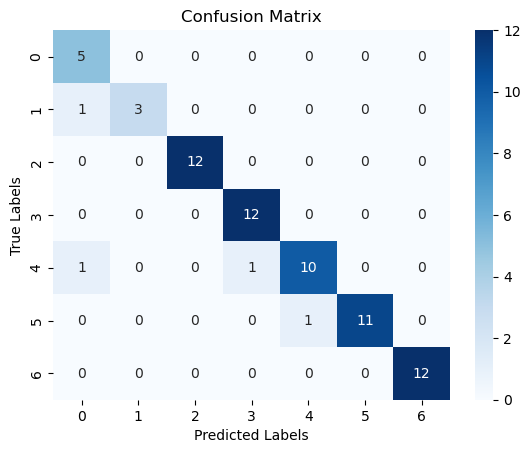

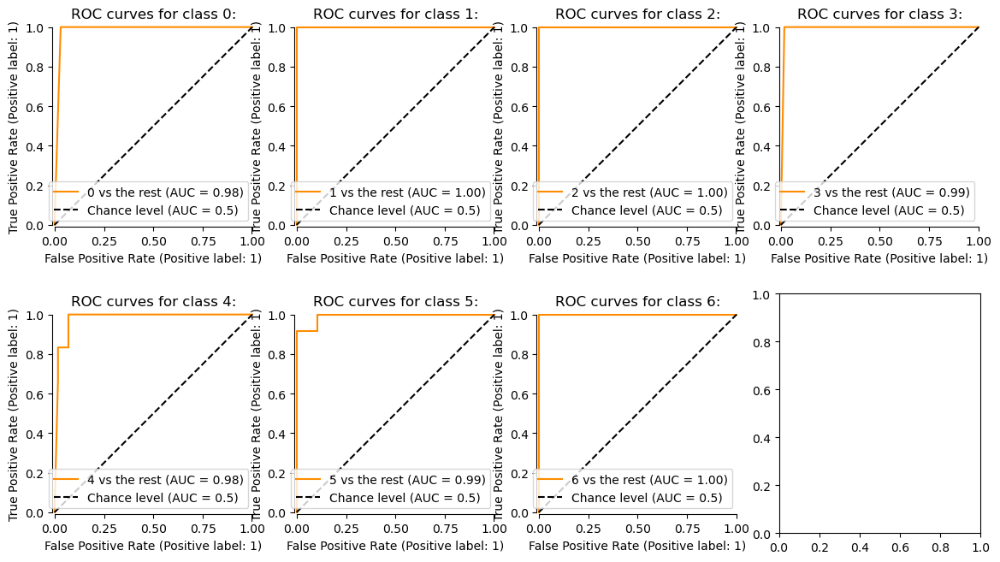

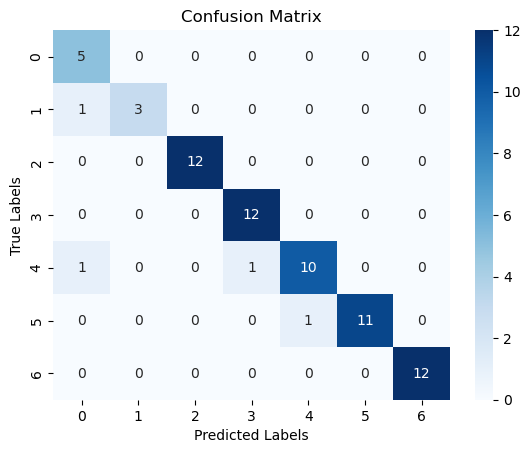

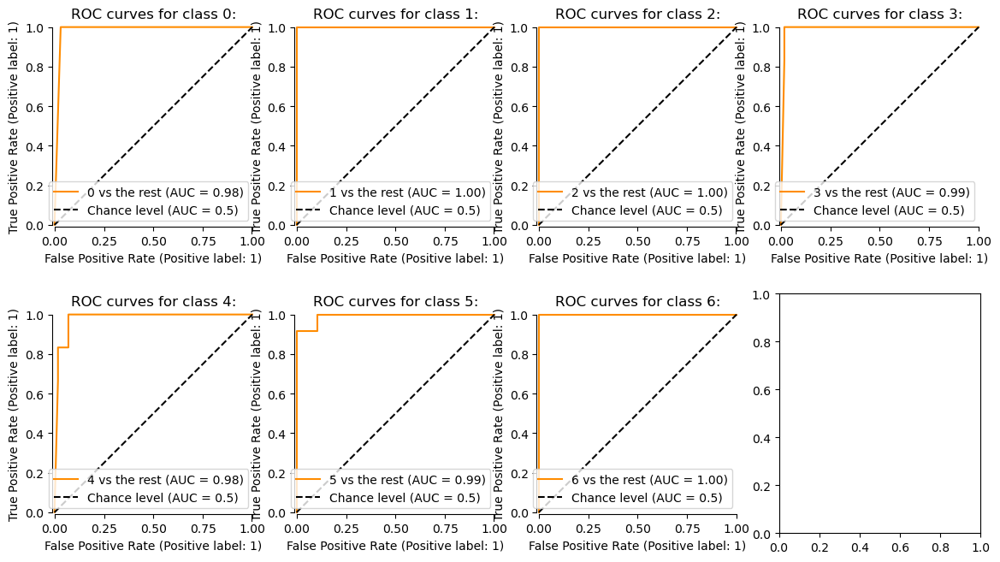

In [ ]:
X_reduced_train = {}
X_reduced_test = {}
model = MultinomialNB()

for l in range(1, 21, 1):
    model.fit(X_train[l], Y_train)

    Y_pred = model.predict(X_train[l])
    Y_score = model.predict_log_proba(X_train[l])

    cm = confusion_matrix(Y_train, Y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()


    fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14, 8))

    for i in range(len(cm)):
        RocCurveDisplay.from_predictions(
            Y_onehot_train[:, i],
            Y_score[:, i],
            ax=axs[i//4, i-4],
            name=f"{i} vs the rest",
            color="darkorange",
            plot_chance_level=True,
            despine=True,
        )
        axs[i//4, i-4].set_title(f'ROC curves for class {i}:')
        axs[i//4, i-4].plot(
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
        )


In [ ]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_train[l], Y_train, cv=5))
    model.fit(X_train[l], Y_train)
    Y_pred = model.predict(X_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

l = 1
Cross Validation Scores: [0.85714286 0.85714286 0.71428571 0.78571429 0.84615385]
Test Accuracy: 0.8947
l = 2
Cross Validation Scores: [0.85714286 0.78571429 0.71428571 0.71428571 0.84615385]
Test Accuracy: 0.7368
l = 3
Cross Validation Scores: [0.85714286 0.85714286 0.64285714 0.78571429 0.84615385]
Test Accuracy: 0.7895
l = 4
Cross Validation Scores: [0.85714286 0.85714286 0.64285714 0.78571429 0.84615385]
Test Accuracy: 0.7895
l = 5
Cross Validation Scores: [0.71428571 0.85714286 0.78571429 0.78571429 0.92307692]
Test Accuracy: 0.7368
l = 6
Cross Validation Scores: [0.78571429 0.92857143 0.71428571 0.71428571 0.84615385]
Test Accuracy: 0.7368
l = 7
Cross Validation Scores: [0.71428571 0.92857143 0.57142857 0.78571429 0.92307692]
Test Accuracy: 0.7368
l = 8
Cross Validation Scores: [0.71428571 0.92857143 0.71428571 0.78571429 0.76923077]
Test Accuracy: 0.7368
l = 9
Cross Validation Scores: [0.71428571 0.92857143 0.71428571 0.71428571 0.76923077]
Test Accuracy: 0.7368
l = 10
Cro

/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=

Test Accuracy: 0.7368
l = 15
Cross Validation Scores: [0.71428571 0.92857143 0.78571429 0.71428571 0.76923077]
Test Accuracy: 0.7895
l = 16
Cross Validation Scores: [0.78571429 0.92857143 0.64285714 0.71428571 0.69230769]
Test Accuracy: 0.7895
l = 17
Cross Validation Scores: [0.78571429 0.92857143 0.57142857 0.71428571 0.69230769]
Test Accuracy: 0.8421
l = 18
Cross Validation Scores: [0.78571429 0.92857143 0.64285714 0.71428571 0.69230769]
Test Accuracy: 0.7895
l = 19
Cross Validation Scores: [0.78571429 0.92857143 0.57142857 0.71428571 0.69230769]
Test Accuracy: 0.8421
l = 20
Cross Validation Scores: [0.78571429 0.92857143 0.64285714 0.71428571 0.69230769]
Test Accuracy: 0.8421


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=